In [1]:
import os
from glob import glob
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
import nibabel as nib
import os
import numpy as np 
import torchvision.transforms as transforms
import nibabel as nib
import torch.optim as optim
from torchvision.transforms import v2
from matplotlib import pyplot as plt
from monai.data import DataLoader, Dataset, CacheDataset

In [25]:
class CTscan(Dataset):
    def __init__(self, data_dir, transform=None):
        self.dir = data_dir
        self.data = sorted(glob(os.path.join(self.dir, 'train', '*nii.gz')))
        self.transform = transform
        
    def __len__(self):
        return len(self.data)     
    
    # end up with channel, row, col
    def __getitem__(self, idx):
        img_file_path = self.data[idx]  # Use the cached list of file paths

        # Load NIfTI file using nibabel
        img_nii = nib.load(img_file_path)
        img_data = img_nii.get_fdata()
        img_data = torch.tensor(img_data, dtype=torch.float32)
        
        # Normalize the data from -1 to 1
#         min_val = img_data.min()
#         max_val = img_data.max()
#         img_data = 2 * ((img_data - min_val) / (max_val - min_val)) - 1
        
        #crop_size = 70
        #start = (img_data.shape[1] - crop_size) // 2
        #end = start + crop_size
        # row col channel
        img_data = img_data[30:-30, 100:-100, :]
    
        img_data = np.clip(img_data, -50, 200)
        # Normalize the data from 0 to 1
        min_val = img_data.min()
        max_val = img_data.max()
        img_data = (img_data - min_val) / (max_val - min_val)
        
        # crop

        
        #img_data = img_data[None, :, :, :]
        img_data = torch.permute(img_data, (2, 0, 1))
        
        return img_data



In [26]:
dataset_train = CTscan(r"D:\LumenResearchDataBase\DataBase\combine\group4\nifiti_file")

train_transform = v2.Compose(
    [
        v2.Resize((256, 256))
    ]
)

#train_loader = DataLoader(dataset_train, batch_size=1)


train_ds = CacheDataset(data=dataset_train, transform=train_transform, cache_rate=1.0)
train_loader = DataLoader(train_ds, batch_size=1)

Loading dataset: 100%|█████████████████████████████████████████████████████████████| 4183/4183 [01:40<00:00, 41.75it/s]


Feature batch shape: torch.Size([1, 4, 256, 256])


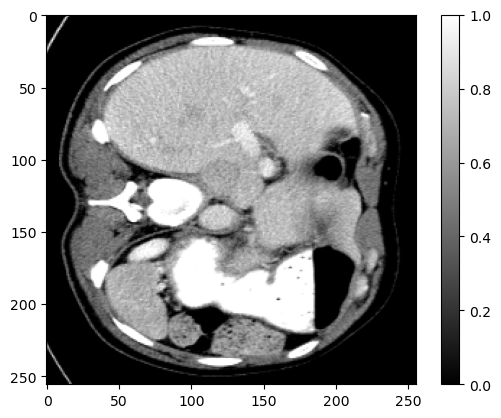

torch.Size([1, 4, 256, 256])


In [21]:
# Create an iterator from the DataLoader
train_loader_iter = iter(train_loader)

# Get the next batch
train_features = next(train_loader_iter)

# Continue with your code
print(f"Feature batch shape: {train_features.size()}")
img = train_features[0]  # Assuming train_features contains image data
plt.imshow(img[2, :, :], cmap="gray")
plt.colorbar()
plt.show()

print(train_features.shape)

In [27]:
import torch
import torch.nn as nn
import torch.nn.functional as F

def parameter_count(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

class Conv(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(Conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)

class ConvTranspose(nn.Module):
    def __init__(self, in_channels, out_channels, kernel_size, stride=1, padding=0):
        super(ConvTranspose, self).__init__()
        self.conv = nn.Sequential(
            nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU()
        )

    def forward(self, x):
        return self.conv(x)

class VAE(nn.Module):
    def __init__(self):
        super(VAE, self).__init__()
        
        base = 16
        
#         self.encoder = nn.Sequential(
#             Conv(4, base, 3, stride=2, padding=1),
#             Conv(base, 2*base, 3, padding=1),
#             Conv(2*base, 4*base, 3, stride=2, padding=1),
#             Conv(4*base, 4*base, 3, padding=1),
#             Conv(4*base, 8*base, 3, stride=2, padding=1),
#             Conv(8*base, 8*base, 3, padding=1),
#             Conv(8*base, 16*base, 3, stride=2, padding=1),
#             Conv(16*base, 16*base, 3, padding=1),
#             nn.Conv2d(16*base, 32*base, 3, stride=2, padding=1),
#             nn.LeakyReLU()
#         )
        
#         self.encoder_mu = nn.Conv2d(32*base, 128, 1)
#         self.encoder_logvar = nn.Conv2d(32*base, 128, 1)
        
#         self.decoder = nn.Sequential(
#             nn.Conv2d(128, 32*base, 1),
#             ConvTranspose(32*base, 16*base, 4, stride=2, padding=1),
#             Conv(16*base, 16*base, 3, padding=1),
#             ConvTranspose(16*base, 8*base, 4, stride=2, padding=1),
#             Conv(8*base, 8*base, 3, padding=1),
#             ConvTranspose(8*base, 4*base, 4, stride=2, padding=1),
#             Conv(4*base, 4*base, 3, padding=1),
#             ConvTranspose(4*base, 2*base, 4, stride=2, padding=1),
#             Conv(2*base, 2*base, 3, padding=1),
#             ConvTranspose(2*base, base, 4, stride=2, padding=1),
#             nn.Conv2d(base, 4, 3, padding=1),
#             nn.Sigmoid()
#         )
        
        
        self.encoder = nn.Sequential(
            Conv(4, base, 3, stride=2, padding=1),
            Conv(base, 2*base, 3, padding=1),
            Conv(2*base, 2*base, 3, stride=2, padding=1),
            Conv(2*base, 2*base, 3, padding=1),
            Conv(2*base, 2*base, 3, stride=2, padding=1),
            Conv(2*base, 4*base, 3, padding=1),
            Conv(4*base, 4*base, 3, stride=2, padding=1),
            Conv(4*base, 4*base, 3, padding=1),
            Conv(4*base, 4*base, 3, stride=2, padding=1),
            nn.Conv2d(4*base, 64*base, 8),
            nn.LeakyReLU()
        )
        
        self.encoder_mu = nn.Conv2d(64*base, 32*base, 1)
        self.encoder_logvar = nn.Conv2d(64*base, 32*base, 1)
        
        self.decoder = nn.Sequential(
            nn.Conv2d(32*base, 64*base, 1),
            ConvTranspose(64*base, 4*base, 8),
            Conv(4*base, 4*base, 3, padding=1),
            ConvTranspose(4*base, 4*base, 4, stride=2, padding=1),
            Conv(4*base, 4*base, 3, padding=1),
            ConvTranspose(4*base, 4*base, 4, stride=2, padding=1),
            Conv(4*base, 2*base, 3, padding=1),
            ConvTranspose(2*base, 2*base, 4, stride=2, padding=1),
            Conv(2*base, 2*base, 3, padding=1),
            ConvTranspose(2*base, 2*base, 4, stride=2, padding=1),
            Conv(2*base, base, 3, padding=1),
            ConvTranspose(base, base, 4, stride=2, padding=1),
            nn.Conv2d(base, 4, 3, padding=1),
            nn.Sigmoid()
        )
        
    def encode(self, x):
        x = self.encoder(x)
        return self.encoder_mu(x), self.encoder_logvar(x)

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5*logvar)
        eps = torch.randn_like(std)
        return mu + eps*std
    
    def decode(self, z):
        return self.decoder(z)

    def forward(self, x):
        mu, logvar = self.encode(x)
        z = self.reparameterize(mu, logvar)
        return self.decode(z), mu, logvar

print('parameter count:', parameter_count(VAE()))

parameter count: 10402660


Epoch 1 -- loss: 0.6984


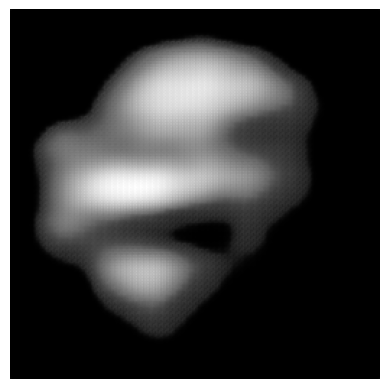

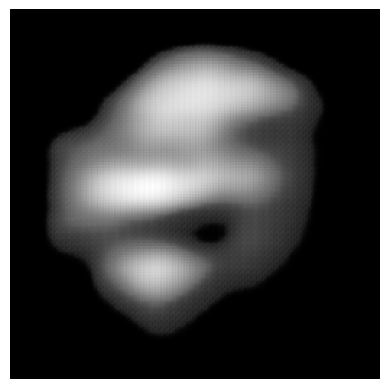

Epoch 2 -- loss: 0.6751
Epoch 3 -- loss: 0.6684
Epoch 4 -- loss: 0.6645
Epoch 5 -- loss: 0.6621
Epoch 6 -- loss: 0.6607
Epoch 7 -- loss: 0.6575
Epoch 8 -- loss: 0.6537
Epoch 9 -- loss: 0.6456
Epoch 10 -- loss: 0.6408
Epoch 11 -- loss: 0.6345
Epoch 12 -- loss: 0.6322
Epoch 13 -- loss: 0.6284
Epoch 14 -- loss: 0.6284
Epoch 15 -- loss: 0.6261
Epoch 16 -- loss: 0.6257


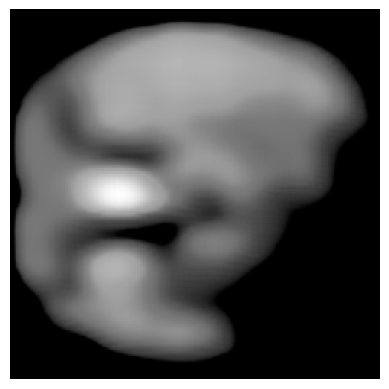

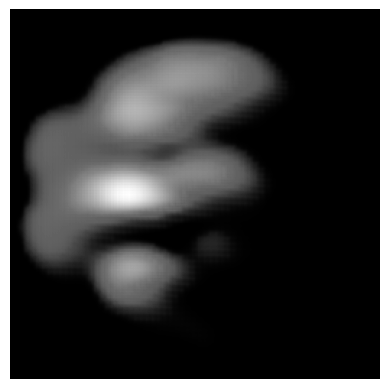

Epoch 17 -- loss: 0.6253
Epoch 18 -- loss: 0.6241
Epoch 19 -- loss: 0.6245
Epoch 20 -- loss: 0.6237
Epoch 21 -- loss: 0.6225
Epoch 22 -- loss: 0.6230
Epoch 23 -- loss: 0.6223
Epoch 24 -- loss: 0.6221
Epoch 25 -- loss: 0.6214
Epoch 26 -- loss: 0.6219
Epoch 27 -- loss: 0.6206
Epoch 28 -- loss: 0.6204
Epoch 29 -- loss: 0.6182
Epoch 30 -- loss: 0.6171
Epoch 31 -- loss: 0.6162


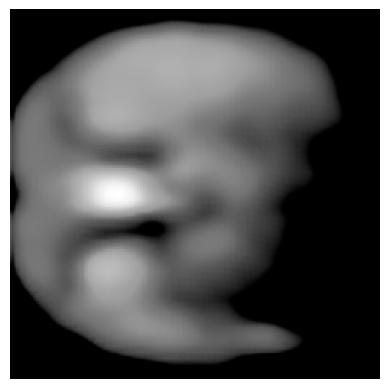

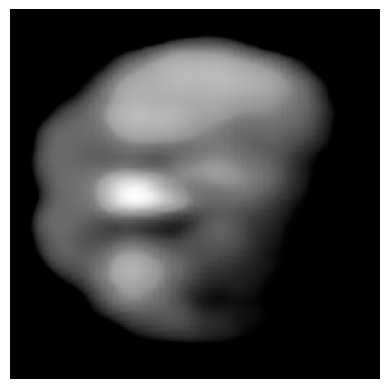

Epoch 32 -- loss: 0.6152
Epoch 33 -- loss: 0.6142
Epoch 34 -- loss: 0.6152
Epoch 35 -- loss: 0.6133
Epoch 36 -- loss: 0.6128
Epoch 37 -- loss: 0.6124
Epoch 38 -- loss: 0.6123
Epoch 39 -- loss: 0.6135
Epoch 40 -- loss: 0.6129
Epoch 41 -- loss: 0.6110
Epoch 42 -- loss: 0.6131
Epoch 43 -- loss: 0.6126
Epoch 44 -- loss: 0.6115
Epoch 45 -- loss: 0.6116
Epoch 46 -- loss: 0.6113


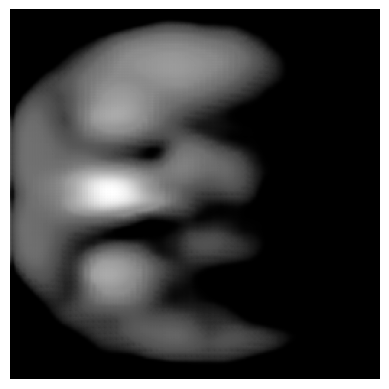

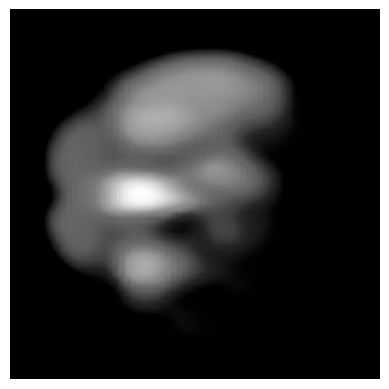

Epoch 47 -- loss: 0.6113
Epoch 48 -- loss: 0.6110
Epoch 49 -- loss: 0.6105
Epoch 50 -- loss: 0.6105
Epoch 51 -- loss: 0.6115
Epoch 52 -- loss: 0.6108
Epoch 53 -- loss: 0.6104
Epoch 54 -- loss: 0.6105
Epoch 55 -- loss: 0.6095
Epoch 56 -- loss: 0.6097
Epoch 57 -- loss: 0.6083
Epoch 58 -- loss: 0.6095
Epoch 59 -- loss: 0.6084
Epoch 60 -- loss: 0.6091
Epoch 61 -- loss: 0.6079


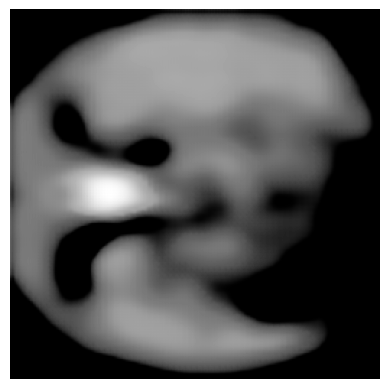

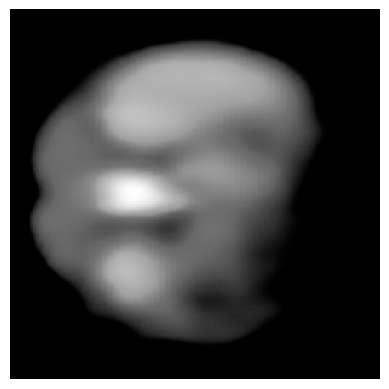

Epoch 62 -- loss: 0.6077
Epoch 63 -- loss: 0.6076
Epoch 64 -- loss: 0.6074
Epoch 65 -- loss: 0.6050
Epoch 66 -- loss: 0.6048
Epoch 67 -- loss: 0.6048
Epoch 68 -- loss: 0.6023
Epoch 69 -- loss: 0.6016
Epoch 70 -- loss: 0.6000
Epoch 71 -- loss: 0.5989
Epoch 72 -- loss: 0.5984
Epoch 73 -- loss: 0.5977
Epoch 74 -- loss: 0.5979
Epoch 75 -- loss: 0.5969
Epoch 76 -- loss: 0.5961


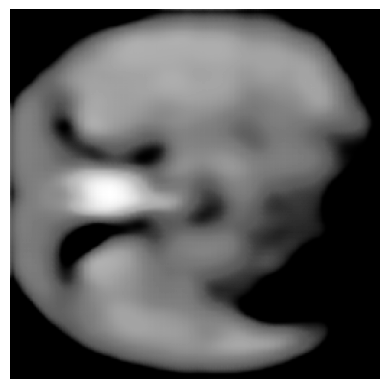

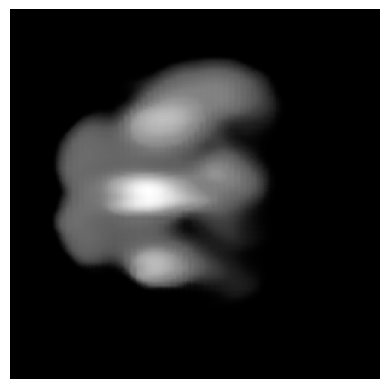

Epoch 77 -- loss: 0.5961
Epoch 78 -- loss: 0.5965
Epoch 79 -- loss: 0.5954
Epoch 80 -- loss: 0.5958
Epoch 81 -- loss: 0.5945
Epoch 82 -- loss: 0.5957
Epoch 83 -- loss: 0.5943
Epoch 84 -- loss: 0.5943
Epoch 85 -- loss: 0.5940
Epoch 86 -- loss: 0.5947
Epoch 87 -- loss: 0.5943
Epoch 88 -- loss: 0.5927
Epoch 89 -- loss: 0.5940
Epoch 90 -- loss: 0.5923
Epoch 91 -- loss: 0.5933


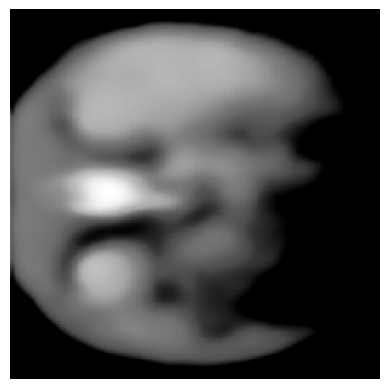

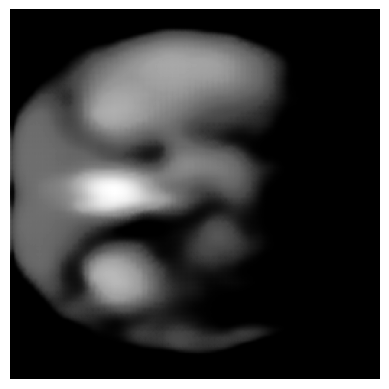

Epoch 92 -- loss: 0.5927
Epoch 93 -- loss: 0.5930
Epoch 94 -- loss: 0.5916
Epoch 95 -- loss: 0.5929
Epoch 96 -- loss: 0.5920
Epoch 97 -- loss: 0.5927
Epoch 98 -- loss: 0.5920
Epoch 99 -- loss: 0.5912
Epoch 100 -- loss: 0.5916
Epoch 101 -- loss: 0.5906
Epoch 102 -- loss: 0.5912
Epoch 103 -- loss: 0.5909
Epoch 104 -- loss: 0.5897
Epoch 105 -- loss: 0.5902
Epoch 106 -- loss: 0.5910


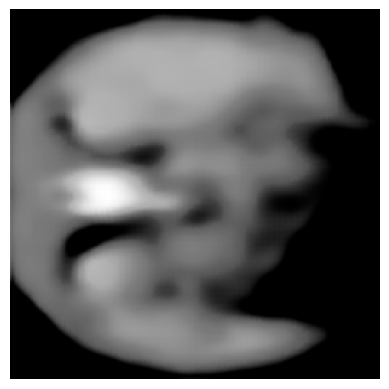

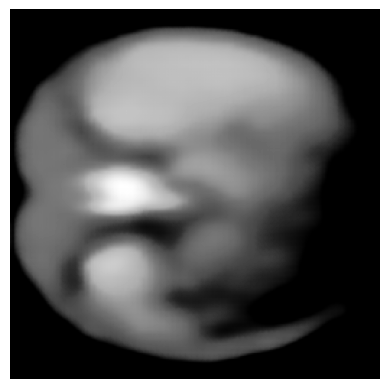

Epoch 107 -- loss: 0.5913
Epoch 108 -- loss: 0.5900
Epoch 109 -- loss: 0.5896
Epoch 110 -- loss: 0.5891
Epoch 111 -- loss: 0.5889
Epoch 112 -- loss: 0.5897
Epoch 113 -- loss: 0.5880
Epoch 114 -- loss: 0.5876
Epoch 115 -- loss: 0.5885
Epoch 116 -- loss: 0.5868
Epoch 117 -- loss: 0.5863
Epoch 118 -- loss: 0.5865
Epoch 119 -- loss: 0.5860
Epoch 120 -- loss: 0.5846
Epoch 121 -- loss: 0.5836


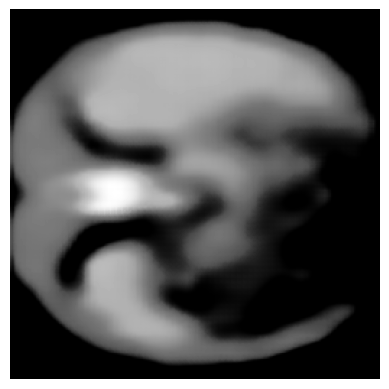

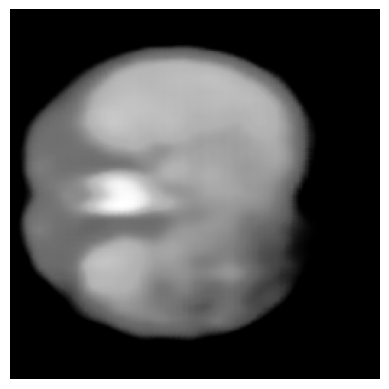

Epoch 122 -- loss: 0.5832
Epoch 123 -- loss: 0.5814
Epoch 124 -- loss: 0.5810
Epoch 125 -- loss: 0.5789
Epoch 126 -- loss: 0.5783
Epoch 127 -- loss: 0.5777
Epoch 128 -- loss: 0.5774
Epoch 129 -- loss: 0.5762
Epoch 130 -- loss: 0.5762
Epoch 131 -- loss: 0.5758
Epoch 132 -- loss: 0.5754
Epoch 133 -- loss: 0.5748
Epoch 134 -- loss: 0.5743
Epoch 135 -- loss: 0.5748
Epoch 136 -- loss: 0.5735


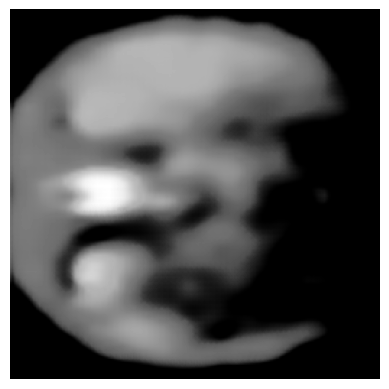

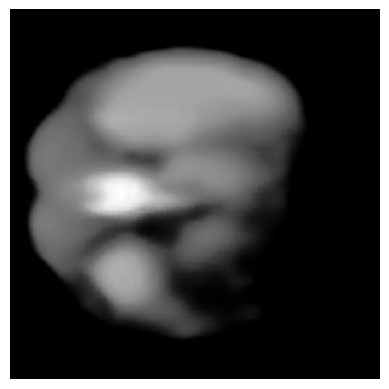

Epoch 137 -- loss: 0.5733
Epoch 138 -- loss: 0.5734
Epoch 139 -- loss: 0.5735
Epoch 140 -- loss: 0.5730
Epoch 141 -- loss: 0.5721
Epoch 142 -- loss: 0.5731
Epoch 143 -- loss: 0.5723
Epoch 144 -- loss: 0.5720
Epoch 145 -- loss: 0.5717
Epoch 146 -- loss: 0.5719
Epoch 147 -- loss: 0.5710
Epoch 148 -- loss: 0.5705
Epoch 149 -- loss: 0.5708
Epoch 150 -- loss: 0.5707
Epoch 151 -- loss: 0.5706


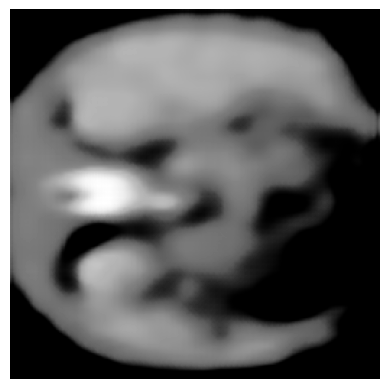

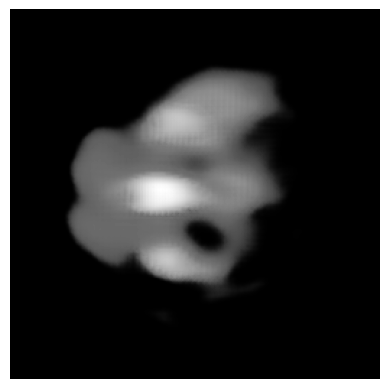

Epoch 152 -- loss: 0.5705
Epoch 153 -- loss: 0.5701
Epoch 154 -- loss: 0.5696
Epoch 155 -- loss: 0.5696
Epoch 156 -- loss: 0.5699
Epoch 157 -- loss: 0.5689
Epoch 158 -- loss: 0.5695
Epoch 159 -- loss: 0.5687
Epoch 160 -- loss: 0.5692
Epoch 161 -- loss: 0.5689
Epoch 162 -- loss: 0.5688
Epoch 163 -- loss: 0.5686
Epoch 164 -- loss: 0.5684
Epoch 165 -- loss: 0.5680
Epoch 166 -- loss: 0.5676


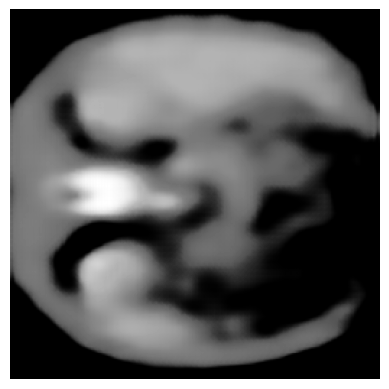

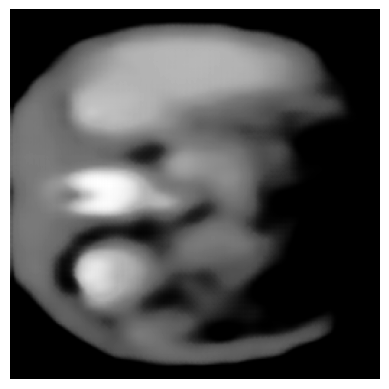

Epoch 167 -- loss: 0.5682
Epoch 168 -- loss: 0.5671
Epoch 169 -- loss: 0.5679
Epoch 170 -- loss: 0.5671
Epoch 171 -- loss: 0.5668
Epoch 172 -- loss: 0.5668
Epoch 173 -- loss: 0.5664
Epoch 174 -- loss: 0.5672
Epoch 175 -- loss: 0.5672
Epoch 176 -- loss: 0.5659
Epoch 177 -- loss: 0.5657
Epoch 178 -- loss: 0.5662
Epoch 179 -- loss: 0.5655
Epoch 180 -- loss: 0.5656
Epoch 181 -- loss: 0.5655


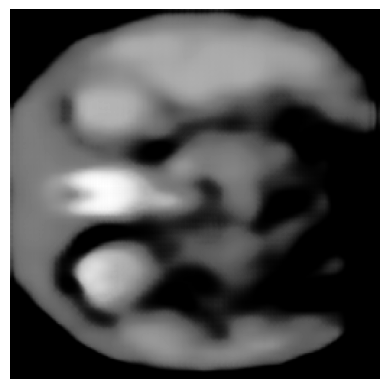

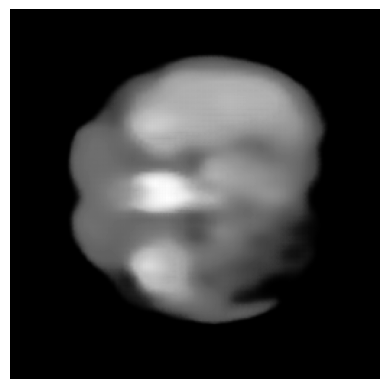

Epoch 182 -- loss: 0.5652
Epoch 183 -- loss: 0.5654
Epoch 184 -- loss: 0.5647
Epoch 185 -- loss: 0.5646
Epoch 186 -- loss: 0.5649
Epoch 187 -- loss: 0.5638
Epoch 188 -- loss: 0.5645
Epoch 189 -- loss: 0.5630
Epoch 190 -- loss: 0.5628
Epoch 191 -- loss: 0.5626
Epoch 192 -- loss: 0.5624
Epoch 193 -- loss: 0.5620
Epoch 194 -- loss: 0.5613
Epoch 195 -- loss: 0.5611
Epoch 196 -- loss: 0.5605


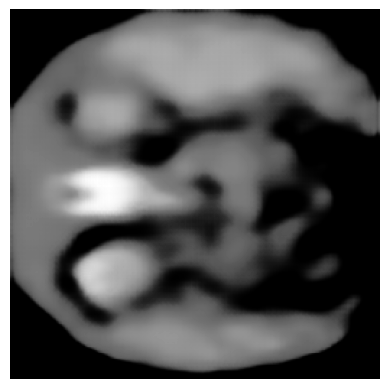

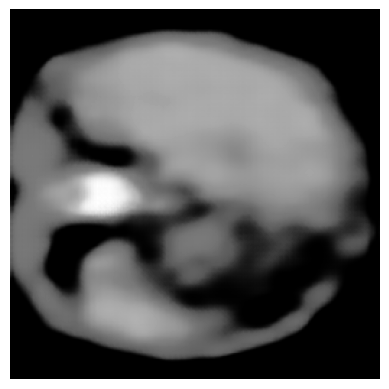

Epoch 197 -- loss: 0.5599
Epoch 198 -- loss: 0.5596
Epoch 199 -- loss: 0.5590
Epoch 200 -- loss: 0.5582
Epoch 201 -- loss: 0.5583
Epoch 202 -- loss: 0.5581
Epoch 203 -- loss: 0.5565
Epoch 204 -- loss: 0.5564
Epoch 205 -- loss: 0.5566
Epoch 206 -- loss: 0.5562
Epoch 207 -- loss: 0.5553
Epoch 208 -- loss: 0.5550
Epoch 209 -- loss: 0.5535
Epoch 210 -- loss: 0.5545
Epoch 211 -- loss: 0.5536


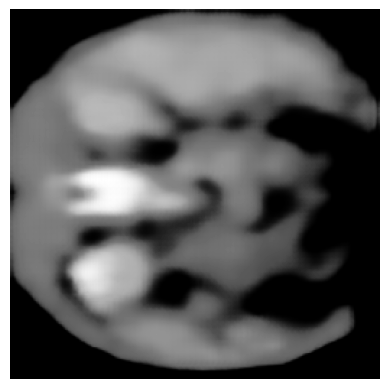

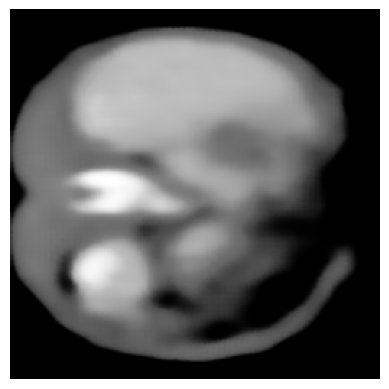

Epoch 212 -- loss: 0.5536
Epoch 213 -- loss: 0.5537
Epoch 214 -- loss: 0.5532
Epoch 215 -- loss: 0.5530
Epoch 216 -- loss: 0.5534
Epoch 217 -- loss: 0.5524
Epoch 218 -- loss: 0.5546
Epoch 219 -- loss: 0.5523
Epoch 220 -- loss: 0.5522
Epoch 221 -- loss: 0.5522
Epoch 222 -- loss: 0.5520
Epoch 223 -- loss: 0.5519
Epoch 224 -- loss: 0.5511
Epoch 225 -- loss: 0.5515
Epoch 226 -- loss: 0.5512


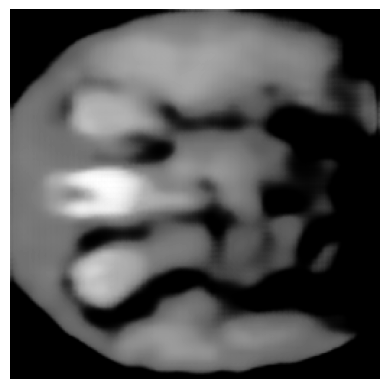

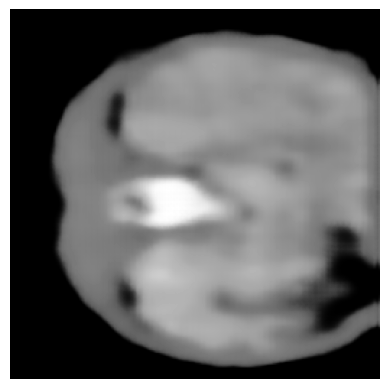

Epoch 227 -- loss: 0.5512
Epoch 228 -- loss: 0.5510
Epoch 229 -- loss: 0.5515
Epoch 230 -- loss: 0.5506
Epoch 231 -- loss: 0.5503
Epoch 232 -- loss: 0.5503
Epoch 233 -- loss: 0.5499
Epoch 234 -- loss: 0.5496
Epoch 235 -- loss: 0.5498
Epoch 236 -- loss: 0.5497
Epoch 237 -- loss: 0.5494
Epoch 238 -- loss: 0.5494
Epoch 239 -- loss: 0.5497
Epoch 240 -- loss: 0.5490
Epoch 241 -- loss: 0.5487


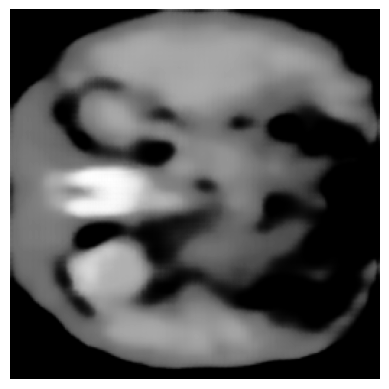

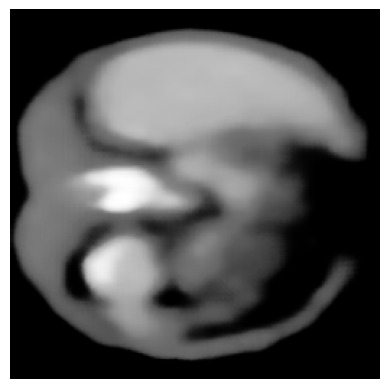

Epoch 242 -- loss: 0.5490
Epoch 243 -- loss: 0.5480
Epoch 244 -- loss: 0.5479
Epoch 245 -- loss: 0.5479
Epoch 246 -- loss: 0.5481
Epoch 247 -- loss: 0.5469
Epoch 248 -- loss: 0.5469
Epoch 249 -- loss: 0.5470
Epoch 250 -- loss: 0.5470
Epoch 251 -- loss: 0.5470
Epoch 252 -- loss: 0.5463
Epoch 253 -- loss: 0.5458
Epoch 254 -- loss: 0.5464
Epoch 255 -- loss: 0.5453
Epoch 256 -- loss: 0.5454


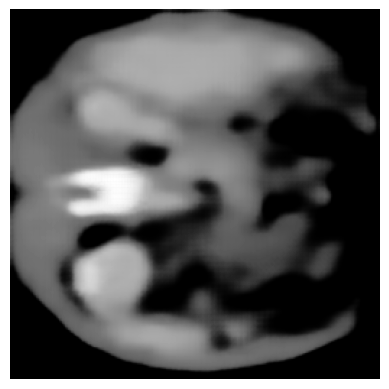

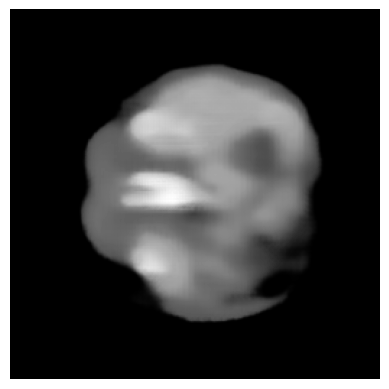

Epoch 257 -- loss: 0.5454
Epoch 258 -- loss: 0.5445
Epoch 259 -- loss: 0.5450
Epoch 260 -- loss: 0.5447
Epoch 261 -- loss: 0.5433
Epoch 262 -- loss: 0.5440
Epoch 263 -- loss: 0.5440
Epoch 264 -- loss: 0.5433
Epoch 265 -- loss: 0.5429
Epoch 266 -- loss: 0.5430
Epoch 267 -- loss: 0.5424
Epoch 268 -- loss: 0.5421
Epoch 269 -- loss: 0.5425
Epoch 270 -- loss: 0.5415
Epoch 271 -- loss: 0.5411


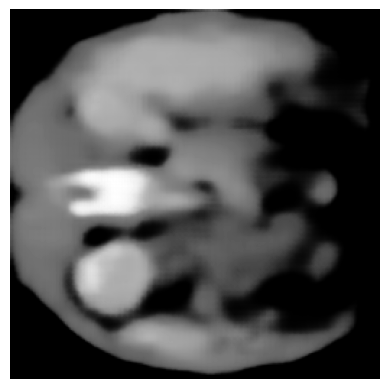

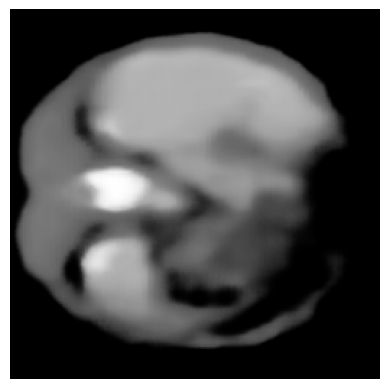

Epoch 272 -- loss: 0.5410
Epoch 273 -- loss: 0.5405
Epoch 274 -- loss: 0.5398
Epoch 275 -- loss: 0.5393
Epoch 276 -- loss: 0.5390
Epoch 277 -- loss: 0.5389
Epoch 278 -- loss: 0.5386
Epoch 279 -- loss: 0.5380
Epoch 280 -- loss: 0.5381
Epoch 281 -- loss: 0.5368
Epoch 282 -- loss: 0.5367
Epoch 283 -- loss: 0.5362
Epoch 284 -- loss: 0.5360
Epoch 285 -- loss: 0.5354
Epoch 286 -- loss: 0.5353


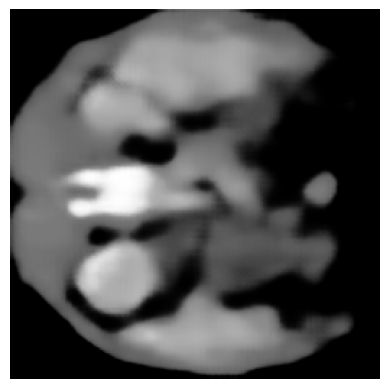

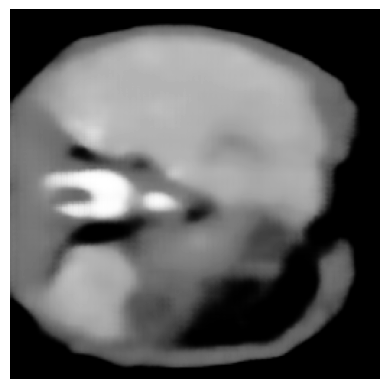

Epoch 287 -- loss: 0.5348
Epoch 288 -- loss: 0.5338
Epoch 289 -- loss: 0.5335
Epoch 290 -- loss: 0.5334
Epoch 291 -- loss: 0.5322
Epoch 292 -- loss: 0.5328
Epoch 293 -- loss: 0.5315
Epoch 294 -- loss: 0.5314
Epoch 295 -- loss: 0.5311
Epoch 296 -- loss: 0.5314
Epoch 297 -- loss: 0.5308
Epoch 298 -- loss: 0.5305
Epoch 299 -- loss: 0.5302
Epoch 300 -- loss: 0.5304
Epoch 301 -- loss: 0.5295


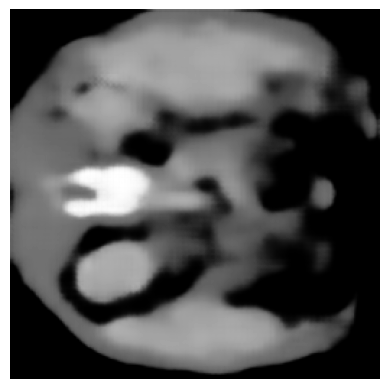

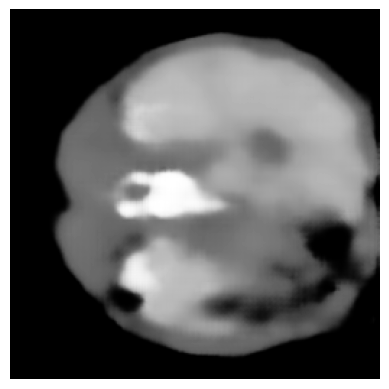

Epoch 302 -- loss: 0.5295
Epoch 303 -- loss: 0.5295
Epoch 304 -- loss: 0.5290
Epoch 305 -- loss: 0.5291
Epoch 306 -- loss: 0.5282
Epoch 307 -- loss: 0.5284
Epoch 308 -- loss: 0.5278
Epoch 309 -- loss: 0.5282
Epoch 310 -- loss: 0.5280
Epoch 311 -- loss: 0.5266
Epoch 312 -- loss: 0.5268
Epoch 313 -- loss: 0.5271
Epoch 314 -- loss: 0.5270
Epoch 315 -- loss: 0.5265
Epoch 316 -- loss: 0.5253


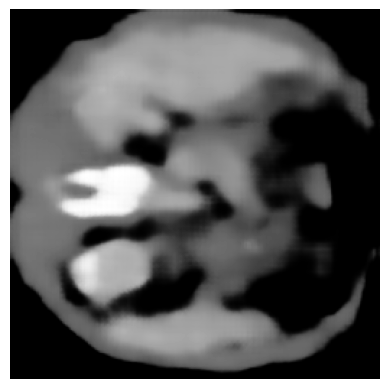

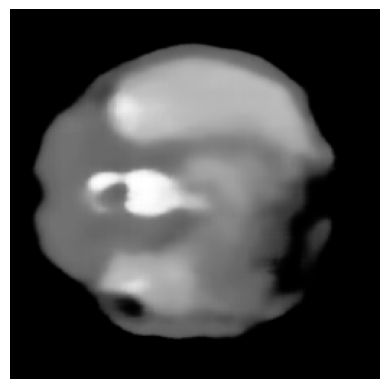

Epoch 317 -- loss: 0.5270
Epoch 318 -- loss: 0.5256
Epoch 319 -- loss: 0.5258
Epoch 320 -- loss: 0.5254
Epoch 321 -- loss: 0.5249
Epoch 322 -- loss: 0.5246
Epoch 323 -- loss: 0.5240
Epoch 324 -- loss: 0.5243
Epoch 325 -- loss: 0.5236
Epoch 326 -- loss: 0.5239
Epoch 327 -- loss: 0.5238
Epoch 328 -- loss: 0.5239
Epoch 329 -- loss: 0.5229
Epoch 330 -- loss: 0.5231
Epoch 331 -- loss: 0.5225


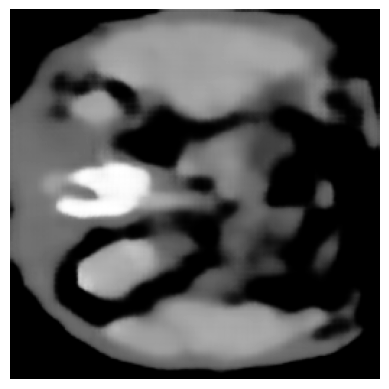

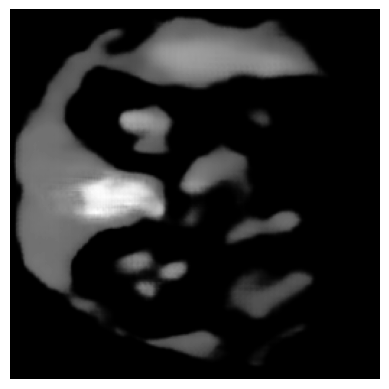

Epoch 332 -- loss: 0.5221
Epoch 333 -- loss: 0.5220
Epoch 334 -- loss: 0.5220
Epoch 335 -- loss: 0.5218
Epoch 336 -- loss: 0.5208
Epoch 337 -- loss: 0.5212
Epoch 338 -- loss: 0.5206
Epoch 339 -- loss: 0.5211
Epoch 340 -- loss: 0.5199
Epoch 341 -- loss: 0.5200
Epoch 342 -- loss: 0.5196
Epoch 343 -- loss: 0.5194
Epoch 344 -- loss: 0.5192
Epoch 345 -- loss: 0.5187
Epoch 346 -- loss: 0.5193


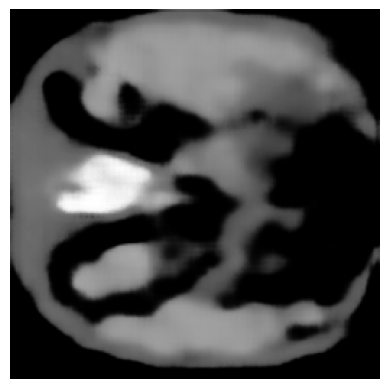

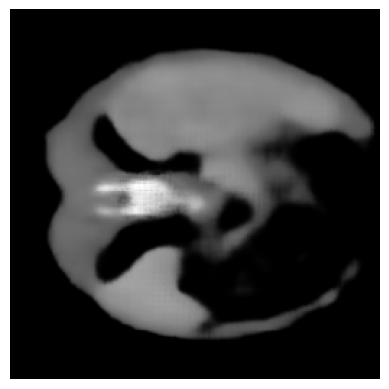

Epoch 347 -- loss: 0.5185
Epoch 348 -- loss: 0.5185
Epoch 349 -- loss: 0.5188
Epoch 350 -- loss: 0.5183
Epoch 351 -- loss: 0.5174
Epoch 352 -- loss: 0.5176
Epoch 353 -- loss: 0.5161
Epoch 354 -- loss: 0.5179
Epoch 355 -- loss: 0.5158
Epoch 356 -- loss: 0.5160
Epoch 357 -- loss: 0.5164
Epoch 358 -- loss: 0.5156
Epoch 359 -- loss: 0.5155
Epoch 360 -- loss: 0.5152
Epoch 361 -- loss: 0.5151


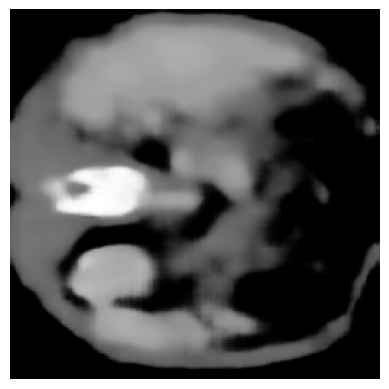

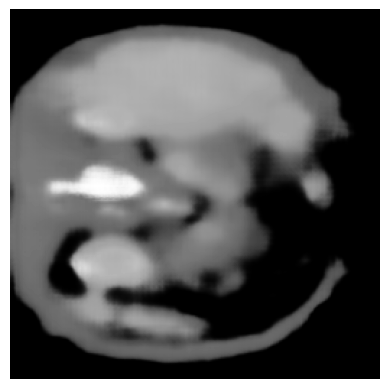

Epoch 362 -- loss: 0.5148
Epoch 363 -- loss: 0.5143
Epoch 364 -- loss: 0.5142
Epoch 365 -- loss: 0.5137
Epoch 366 -- loss: 0.5135
Epoch 367 -- loss: 0.5135
Epoch 368 -- loss: 0.5135
Epoch 369 -- loss: 0.5139
Epoch 370 -- loss: 0.5128
Epoch 371 -- loss: 0.5128
Epoch 372 -- loss: 0.5126
Epoch 373 -- loss: 0.5120
Epoch 374 -- loss: 0.5113
Epoch 375 -- loss: 0.5111
Epoch 376 -- loss: 0.5115


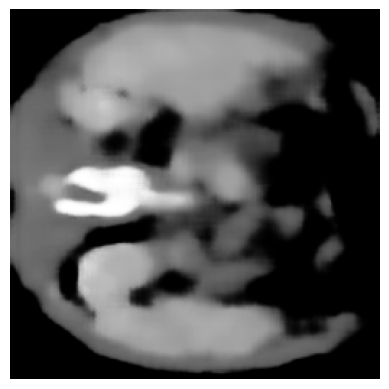

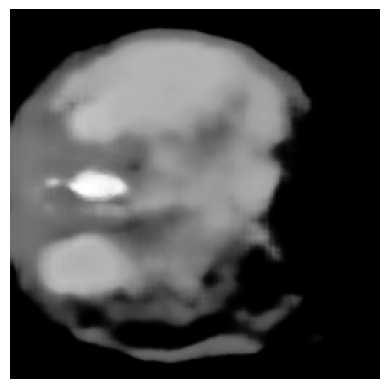

Epoch 377 -- loss: 0.5116
Epoch 378 -- loss: 0.5111
Epoch 379 -- loss: 0.5107
Epoch 380 -- loss: 0.5107
Epoch 381 -- loss: 0.5103
Epoch 382 -- loss: 0.5101
Epoch 383 -- loss: 0.5095
Epoch 384 -- loss: 0.5097
Epoch 385 -- loss: 0.5097
Epoch 386 -- loss: 0.5088
Epoch 387 -- loss: 0.5085
Epoch 388 -- loss: 0.5081
Epoch 389 -- loss: 0.5078
Epoch 390 -- loss: 0.5078
Epoch 391 -- loss: 0.5078


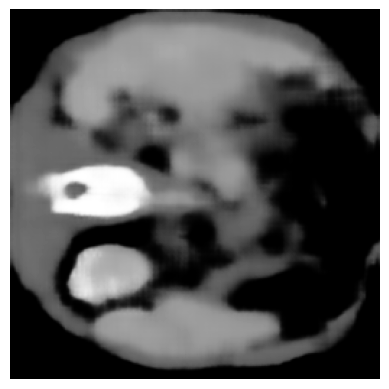

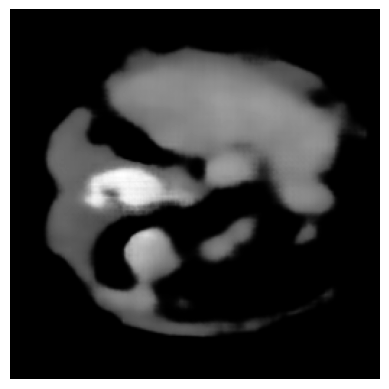

Epoch 392 -- loss: 0.5074
Epoch 393 -- loss: 0.5069
Epoch 394 -- loss: 0.5072
Epoch 395 -- loss: 0.5134
Epoch 396 -- loss: 0.5058
Epoch 397 -- loss: 0.5061
Epoch 398 -- loss: 0.5063
Epoch 399 -- loss: 0.5055
Epoch 400 -- loss: 0.5056
Epoch 401 -- loss: 0.5053
Epoch 402 -- loss: 0.5051
Epoch 403 -- loss: 0.5052
Epoch 404 -- loss: 0.5045
Epoch 405 -- loss: 0.5042
Epoch 406 -- loss: 0.5044


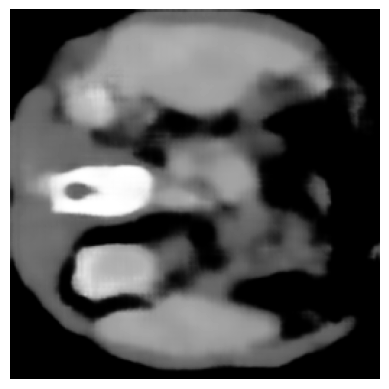

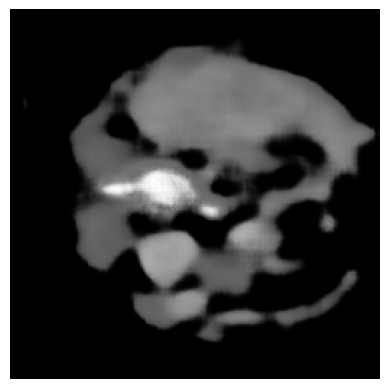

Epoch 407 -- loss: 0.5032
Epoch 408 -- loss: 0.5035
Epoch 409 -- loss: 0.5031
Epoch 410 -- loss: 0.5031
Epoch 411 -- loss: 0.5029
Epoch 412 -- loss: 0.5025
Epoch 413 -- loss: 0.5033
Epoch 414 -- loss: 0.5024
Epoch 415 -- loss: 0.5023
Epoch 416 -- loss: 0.5015
Epoch 417 -- loss: 0.5018
Epoch 418 -- loss: 0.5017
Epoch 419 -- loss: 0.5020
Epoch 420 -- loss: 0.5020
Epoch 421 -- loss: 0.5022


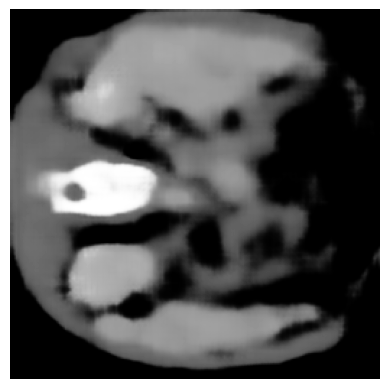

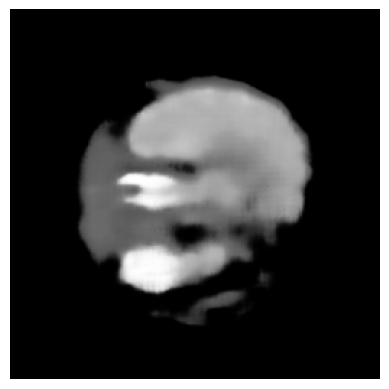

Epoch 422 -- loss: 0.5010
Epoch 423 -- loss: 0.5008
Epoch 424 -- loss: 0.5002
Epoch 425 -- loss: 0.5006
Epoch 426 -- loss: 0.4993
Epoch 427 -- loss: 0.4996
Epoch 428 -- loss: 0.4996
Epoch 429 -- loss: 0.4997
Epoch 430 -- loss: 0.4993
Epoch 431 -- loss: 0.4991
Epoch 432 -- loss: 0.4993
Epoch 433 -- loss: 0.4988
Epoch 434 -- loss: 0.4985
Epoch 435 -- loss: 0.4982
Epoch 436 -- loss: 0.4982


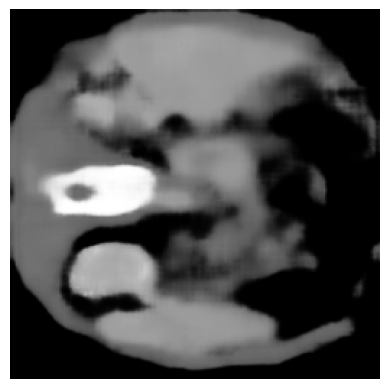

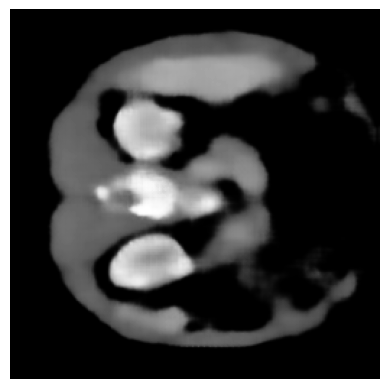

Epoch 437 -- loss: 0.4971
Epoch 438 -- loss: 0.4975
Epoch 439 -- loss: 0.4984
Epoch 440 -- loss: 0.4974
Epoch 441 -- loss: 0.4967
Epoch 442 -- loss: 0.4966
Epoch 443 -- loss: 0.4964
Epoch 444 -- loss: 0.4967
Epoch 445 -- loss: 0.4952
Epoch 446 -- loss: 0.4960
Epoch 447 -- loss: 0.4953
Epoch 448 -- loss: 0.4950
Epoch 449 -- loss: 0.4960
Epoch 450 -- loss: 0.4949
Epoch 451 -- loss: 0.4946


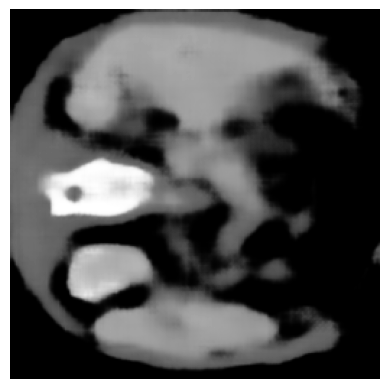

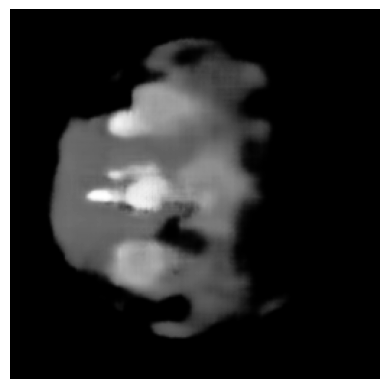

Epoch 452 -- loss: 0.4947
Epoch 453 -- loss: 0.4937
Epoch 454 -- loss: 0.4938
Epoch 455 -- loss: 0.4941
Epoch 456 -- loss: 0.4932
Epoch 457 -- loss: 0.4948
Epoch 458 -- loss: 0.4931
Epoch 459 -- loss: 0.4933
Epoch 460 -- loss: 0.4933
Epoch 461 -- loss: 0.4928
Epoch 462 -- loss: 0.4927
Epoch 463 -- loss: 0.4930
Epoch 464 -- loss: 0.4922
Epoch 465 -- loss: 0.4915
Epoch 466 -- loss: 0.4918


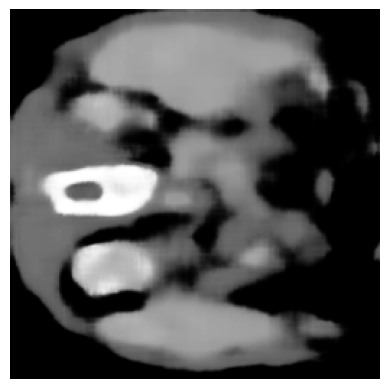

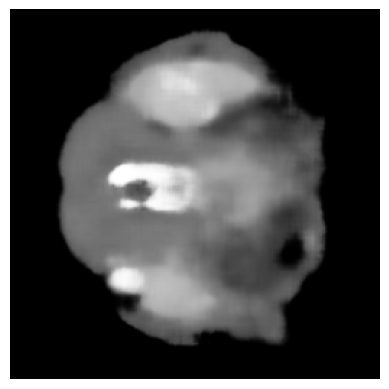

Epoch 467 -- loss: 0.4915
Epoch 468 -- loss: 0.4913
Epoch 469 -- loss: 0.4903
Epoch 470 -- loss: 0.4901
Epoch 471 -- loss: 0.4893
Epoch 472 -- loss: 0.4900
Epoch 473 -- loss: 0.4909
Epoch 474 -- loss: 0.4905
Epoch 475 -- loss: 0.4898
Epoch 476 -- loss: 0.4894
Epoch 477 -- loss: 0.4895
Epoch 478 -- loss: 0.4897
Epoch 479 -- loss: 0.4889
Epoch 480 -- loss: 0.4887
Epoch 481 -- loss: 0.4887


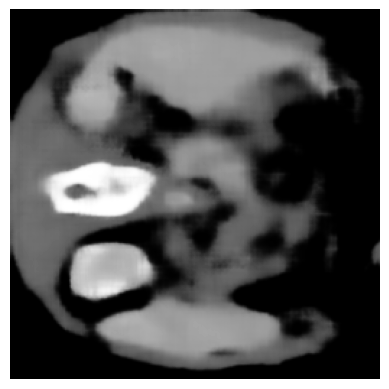

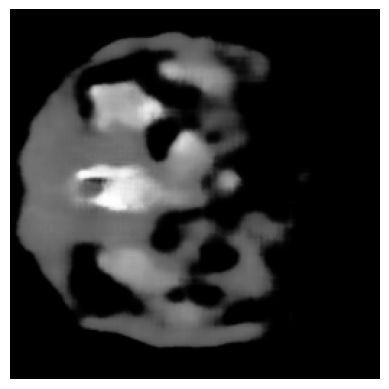

Epoch 482 -- loss: 0.4889
Epoch 483 -- loss: 0.4881
Epoch 484 -- loss: 0.4881
Epoch 485 -- loss: 0.4887
Epoch 486 -- loss: 0.4881
Epoch 487 -- loss: 0.4872
Epoch 488 -- loss: 0.4887
Epoch 489 -- loss: 0.4866
Epoch 490 -- loss: 0.4869
Epoch 491 -- loss: 0.4869
Epoch 492 -- loss: 0.4873
Epoch 493 -- loss: 0.4868
Epoch 494 -- loss: 0.4869
Epoch 495 -- loss: 0.4863
Epoch 496 -- loss: 0.4861


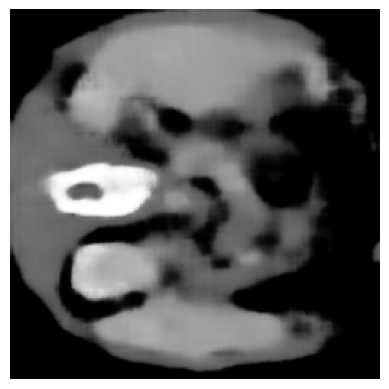

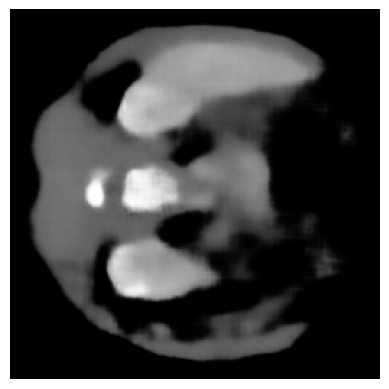

Epoch 497 -- loss: 0.4854
Epoch 498 -- loss: 0.4857
Epoch 499 -- loss: 0.4860
Epoch 500 -- loss: 0.4854
Epoch 501 -- loss: 0.4854
Epoch 502 -- loss: 0.4848
Epoch 503 -- loss: 0.4853
Epoch 504 -- loss: 0.4848
Epoch 505 -- loss: 0.4843
Epoch 506 -- loss: 0.4839
Epoch 507 -- loss: 0.4842
Epoch 508 -- loss: 0.4839
Epoch 509 -- loss: 0.4841
Epoch 510 -- loss: 0.4835
Epoch 511 -- loss: 0.4849


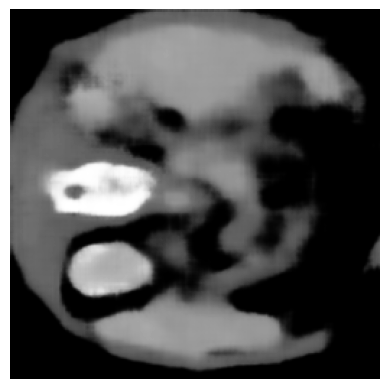

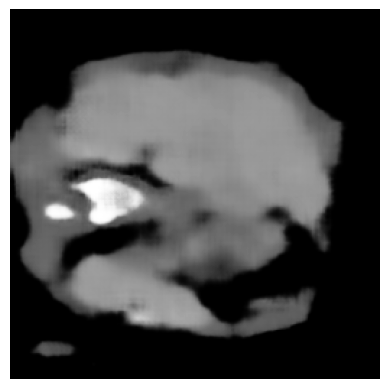

Epoch 512 -- loss: 0.4820
Epoch 513 -- loss: 0.4832
Epoch 514 -- loss: 0.4832
Epoch 515 -- loss: 0.4827
Epoch 516 -- loss: 0.4829
Epoch 517 -- loss: 0.4827
Epoch 518 -- loss: 0.4822
Epoch 519 -- loss: 0.4823
Epoch 520 -- loss: 0.4821
Epoch 521 -- loss: 0.4820
Epoch 522 -- loss: 0.4820
Epoch 523 -- loss: 0.4870
Epoch 524 -- loss: 0.4821
Epoch 525 -- loss: 0.4809
Epoch 526 -- loss: 0.4805


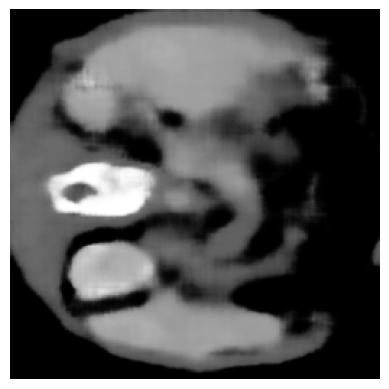

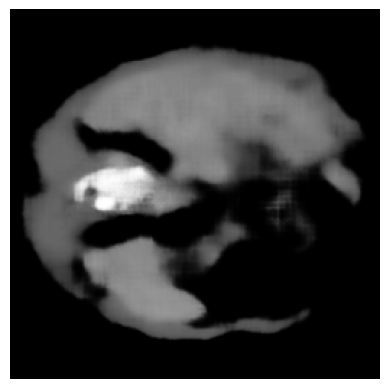

Epoch 527 -- loss: 0.4808
Epoch 528 -- loss: 0.4808
Epoch 529 -- loss: 0.4809
Epoch 530 -- loss: 0.4812
Epoch 531 -- loss: 0.4806
Epoch 532 -- loss: 0.4811
Epoch 533 -- loss: 0.4801
Epoch 534 -- loss: 0.4797
Epoch 535 -- loss: 0.4804
Epoch 536 -- loss: 0.4798
Epoch 537 -- loss: 0.4788
Epoch 538 -- loss: 0.4792
Epoch 539 -- loss: 0.4795
Epoch 540 -- loss: 0.4796
Epoch 541 -- loss: 0.4792


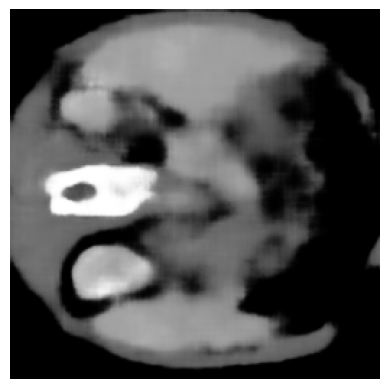

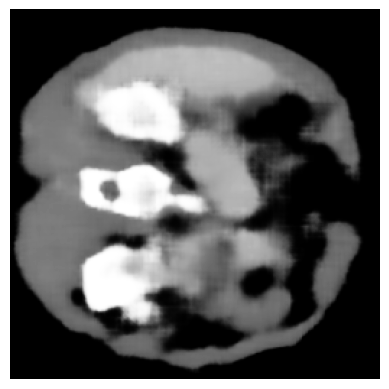

Epoch 542 -- loss: 0.4791
Epoch 543 -- loss: 0.4788
Epoch 544 -- loss: 0.4791
Epoch 545 -- loss: 0.4782
Epoch 546 -- loss: 0.4780
Epoch 547 -- loss: 0.4783
Epoch 548 -- loss: 0.4782
Epoch 549 -- loss: 0.4777
Epoch 550 -- loss: 0.4790
Epoch 551 -- loss: 0.4777
Epoch 552 -- loss: 0.4773
Epoch 553 -- loss: 0.4763
Epoch 554 -- loss: 0.4775
Epoch 555 -- loss: 0.4770
Epoch 556 -- loss: 0.4780


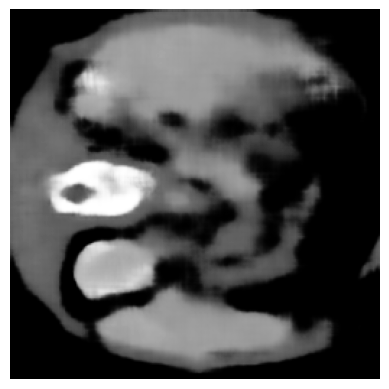

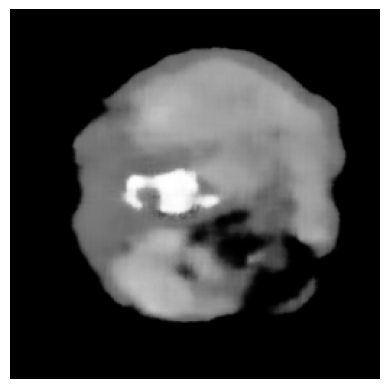

Epoch 557 -- loss: 0.4763
Epoch 558 -- loss: 0.4766
Epoch 559 -- loss: 0.4764
Epoch 560 -- loss: 0.4763
Epoch 561 -- loss: 0.4761
Epoch 562 -- loss: 0.4754
Epoch 563 -- loss: 0.4752
Epoch 564 -- loss: 0.4758
Epoch 565 -- loss: 0.4751
Epoch 566 -- loss: 0.4757
Epoch 567 -- loss: 0.4758
Epoch 568 -- loss: 0.4751
Epoch 569 -- loss: 0.4745
Epoch 570 -- loss: 0.4750
Epoch 571 -- loss: 0.4747


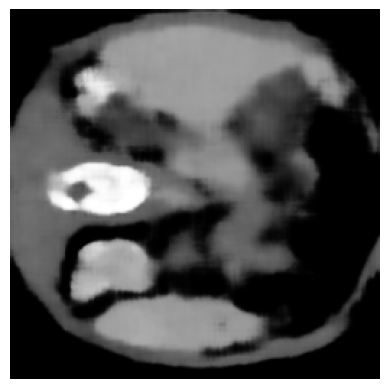

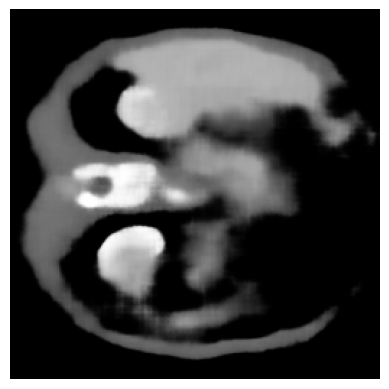

Epoch 572 -- loss: 0.4752
Epoch 573 -- loss: 0.4747
Epoch 574 -- loss: 0.4749
Epoch 575 -- loss: 0.4743
Epoch 576 -- loss: 0.4743
Epoch 577 -- loss: 0.4738
Epoch 578 -- loss: 0.4730
Epoch 579 -- loss: 0.4744
Epoch 580 -- loss: 0.4736
Epoch 581 -- loss: 0.4747
Epoch 582 -- loss: 0.4738
Epoch 583 -- loss: 0.4737
Epoch 584 -- loss: 0.4743
Epoch 585 -- loss: 0.4734
Epoch 586 -- loss: 0.4731


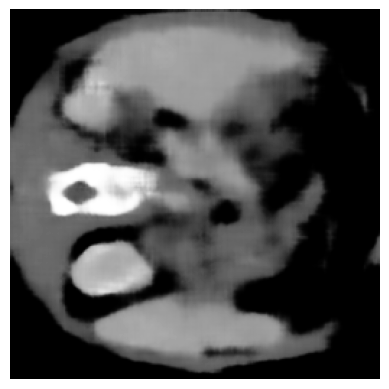

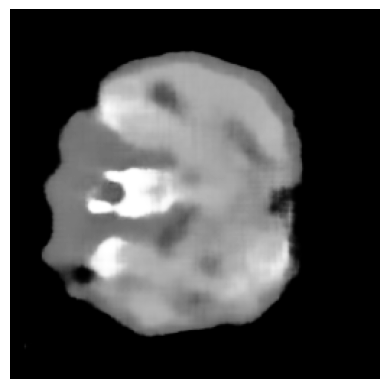

Epoch 587 -- loss: 0.4727
Epoch 588 -- loss: 0.4732
Epoch 589 -- loss: 0.4717
Epoch 590 -- loss: 0.4726
Epoch 591 -- loss: 0.4718
Epoch 592 -- loss: 0.4728
Epoch 593 -- loss: 0.4728
Epoch 594 -- loss: 0.4719
Epoch 595 -- loss: 0.4720
Epoch 596 -- loss: 0.4732
Epoch 597 -- loss: 0.4718
Epoch 598 -- loss: 0.4713
Epoch 599 -- loss: 0.4716
Epoch 600 -- loss: 0.4705
Epoch 601 -- loss: 0.4705


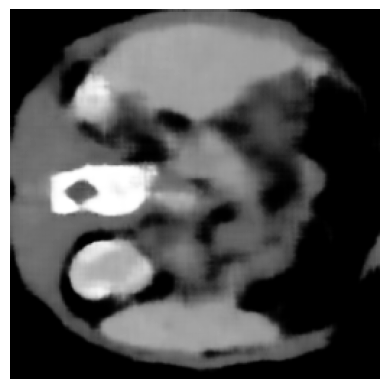

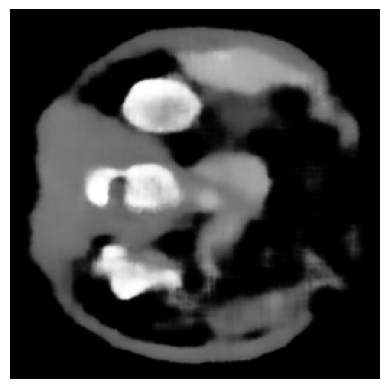

Epoch 602 -- loss: 0.4710
Epoch 603 -- loss: 0.4706
Epoch 604 -- loss: 0.4705
Epoch 605 -- loss: 0.4706
Epoch 606 -- loss: 0.4702
Epoch 607 -- loss: 0.4703
Epoch 608 -- loss: 0.4705
Epoch 609 -- loss: 0.4701
Epoch 610 -- loss: 0.4696
Epoch 611 -- loss: 0.4696
Epoch 612 -- loss: 0.4696
Epoch 613 -- loss: 0.4699
Epoch 614 -- loss: 0.4698
Epoch 615 -- loss: 0.4692
Epoch 616 -- loss: 0.4695


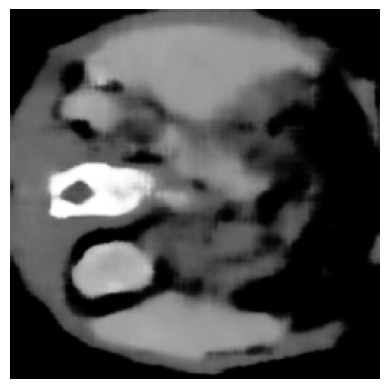

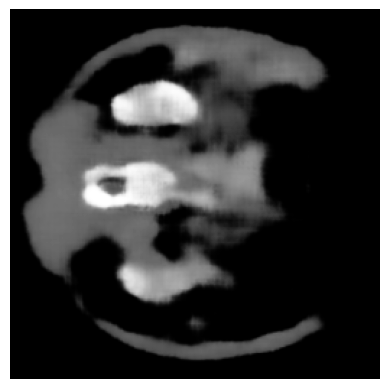

Epoch 617 -- loss: 0.4691
Epoch 618 -- loss: 0.4695
Epoch 619 -- loss: 0.4683
Epoch 620 -- loss: 0.4691
Epoch 621 -- loss: 0.4687
Epoch 622 -- loss: 0.4711
Epoch 623 -- loss: 0.4683
Epoch 624 -- loss: 0.4680
Epoch 625 -- loss: 0.4679
Epoch 626 -- loss: 0.4681
Epoch 627 -- loss: 0.4677
Epoch 628 -- loss: 0.4681
Epoch 629 -- loss: 0.4672
Epoch 630 -- loss: 0.4675
Epoch 631 -- loss: 0.4672


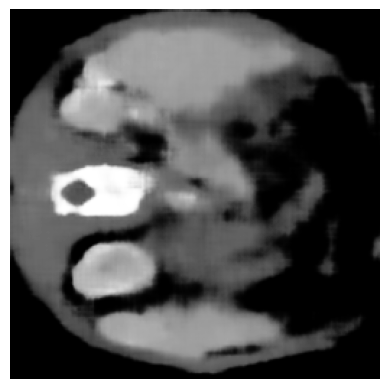

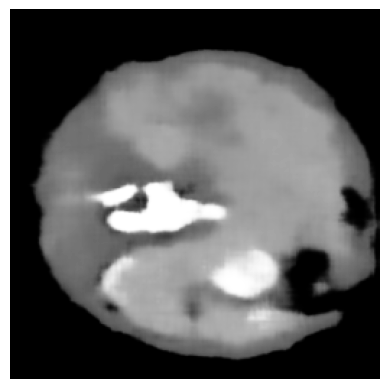

Epoch 632 -- loss: 0.4668
Epoch 633 -- loss: 0.4678
Epoch 634 -- loss: 0.4674
Epoch 635 -- loss: 0.4674
Epoch 636 -- loss: 0.4678
Epoch 637 -- loss: 0.4672
Epoch 638 -- loss: 0.4677
Epoch 639 -- loss: 0.4669
Epoch 640 -- loss: 0.4673
Epoch 641 -- loss: 0.4669
Epoch 642 -- loss: 0.4671
Epoch 643 -- loss: 0.4663
Epoch 644 -- loss: 0.4658
Epoch 645 -- loss: 0.4658
Epoch 646 -- loss: 0.4663


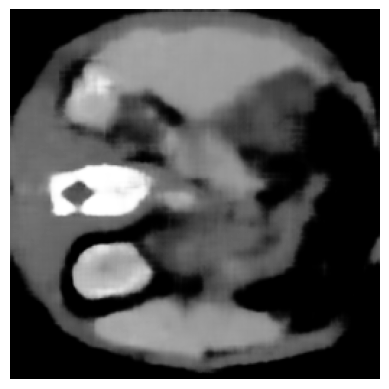

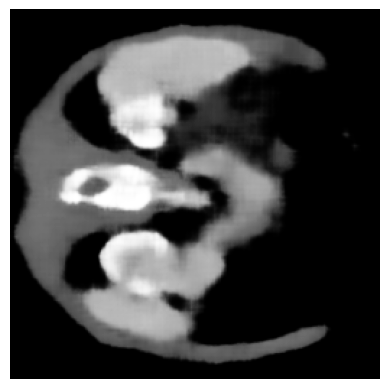

Epoch 647 -- loss: 0.4663
Epoch 648 -- loss: 0.4667
Epoch 649 -- loss: 0.4658
Epoch 650 -- loss: 0.4665
Epoch 651 -- loss: 0.4662
Epoch 652 -- loss: 0.4661
Epoch 653 -- loss: 0.4652
Epoch 654 -- loss: 0.4655
Epoch 655 -- loss: 0.4659
Epoch 656 -- loss: 0.4657
Epoch 657 -- loss: 0.4655
Epoch 658 -- loss: 0.4652
Epoch 659 -- loss: 0.4647
Epoch 660 -- loss: 0.4647
Epoch 661 -- loss: 0.4654


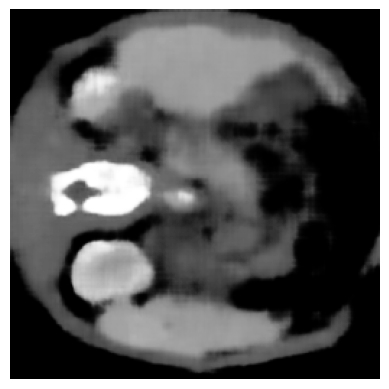

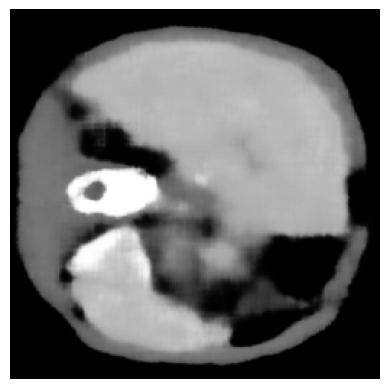

Epoch 662 -- loss: 0.4643
Epoch 663 -- loss: 0.4646
Epoch 664 -- loss: 0.4646
Epoch 665 -- loss: 0.4651
Epoch 666 -- loss: 0.4644
Epoch 667 -- loss: 0.4640
Epoch 668 -- loss: 45.0833
Epoch 669 -- loss: 0.4892
Epoch 670 -- loss: 0.4774
Epoch 671 -- loss: 0.4716
Epoch 672 -- loss: 0.4677
Epoch 673 -- loss: 0.4659
Epoch 674 -- loss: 0.4647
Epoch 675 -- loss: 0.4644
Epoch 676 -- loss: 0.4640


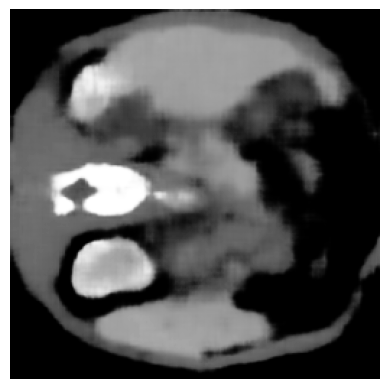

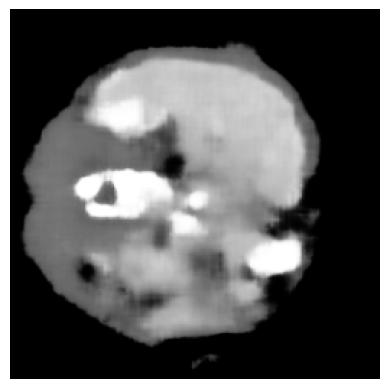

Epoch 677 -- loss: 0.4647
Epoch 678 -- loss: 0.4656
Epoch 679 -- loss: 0.4634
Epoch 680 -- loss: 0.4643
Epoch 681 -- loss: 0.4641
Epoch 682 -- loss: 0.4642
Epoch 683 -- loss: 0.4634
Epoch 684 -- loss: 0.4632
Epoch 685 -- loss: 0.4633
Epoch 686 -- loss: 0.4633
Epoch 687 -- loss: 0.4631
Epoch 688 -- loss: 0.4629
Epoch 689 -- loss: 0.4631
Epoch 690 -- loss: 0.4621
Epoch 691 -- loss: 0.4626


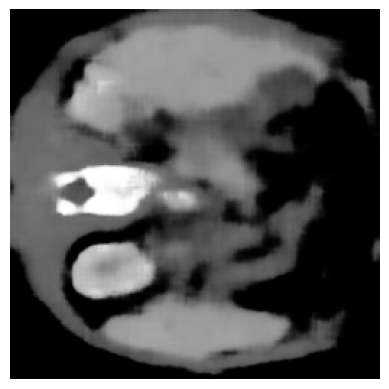

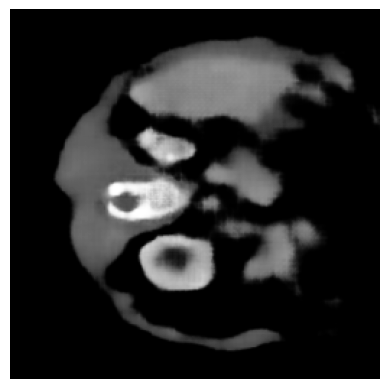

Epoch 692 -- loss: 0.4621
Epoch 693 -- loss: 0.4629
Epoch 694 -- loss: 0.4627
Epoch 695 -- loss: 0.4622
Epoch 696 -- loss: 0.4621
Epoch 697 -- loss: 0.4618
Epoch 698 -- loss: 0.4623
Epoch 699 -- loss: 0.4617
Epoch 700 -- loss: 0.4615
Epoch 701 -- loss: 0.4607
Epoch 702 -- loss: 0.4611
Epoch 703 -- loss: 0.4610
Epoch 704 -- loss: 0.4610
Epoch 705 -- loss: 0.4609
Epoch 706 -- loss: 0.4619


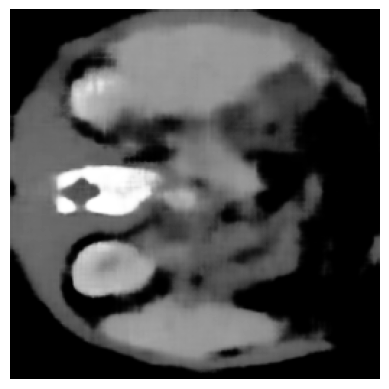

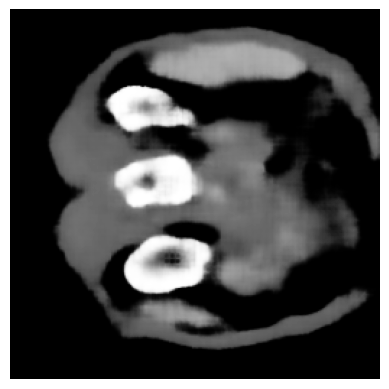

Epoch 707 -- loss: 0.4610
Epoch 708 -- loss: 0.4611
Epoch 709 -- loss: 0.4603
Epoch 710 -- loss: 0.4599
Epoch 711 -- loss: 0.4618
Epoch 712 -- loss: 0.4612
Epoch 713 -- loss: 0.4608
Epoch 714 -- loss: 0.4600
Epoch 715 -- loss: 0.4602
Epoch 716 -- loss: 0.4603
Epoch 717 -- loss: 0.4602
Epoch 718 -- loss: 0.4600
Epoch 719 -- loss: 0.4592
Epoch 720 -- loss: 0.4602
Epoch 721 -- loss: 0.4596


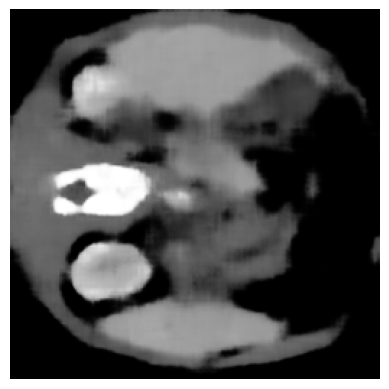

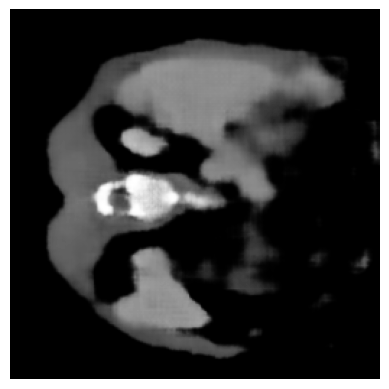

Epoch 722 -- loss: 0.4604
Epoch 723 -- loss: 0.4593
Epoch 724 -- loss: 0.4593
Epoch 725 -- loss: 0.4596
Epoch 726 -- loss: 0.4593
Epoch 727 -- loss: 0.4594
Epoch 728 -- loss: 0.4591
Epoch 729 -- loss: 0.4593
Epoch 730 -- loss: 0.4594
Epoch 731 -- loss: 0.4589
Epoch 732 -- loss: 0.4585
Epoch 733 -- loss: 0.4589
Epoch 734 -- loss: 0.4594
Epoch 735 -- loss: 0.4594
Epoch 736 -- loss: 0.4591


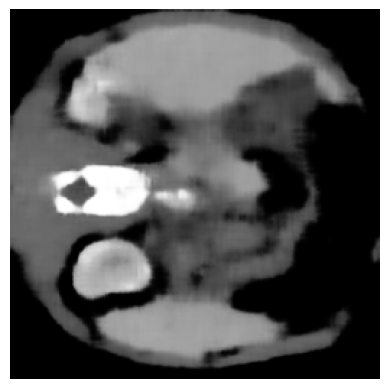

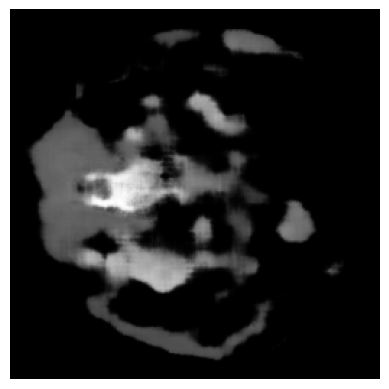

Epoch 737 -- loss: 0.4580
Epoch 738 -- loss: 0.4580
Epoch 739 -- loss: 0.4573
Epoch 740 -- loss: 0.4577
Epoch 741 -- loss: 0.4581
Epoch 742 -- loss: 0.4585
Epoch 743 -- loss: 0.4586
Epoch 744 -- loss: 0.4588
Epoch 745 -- loss: 0.4584
Epoch 746 -- loss: 0.4574
Epoch 747 -- loss: 0.4583
Epoch 748 -- loss: 0.4574
Epoch 749 -- loss: 0.4571
Epoch 750 -- loss: 0.4572
Epoch 751 -- loss: 0.4583


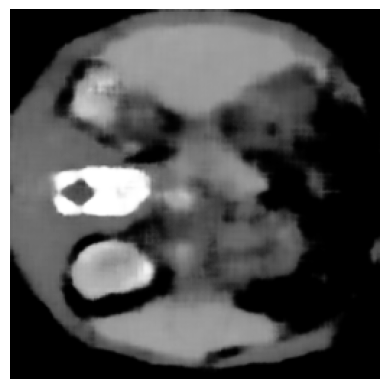

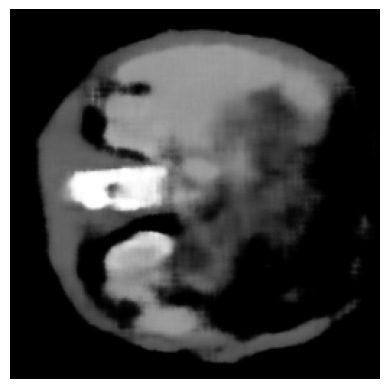

Epoch 752 -- loss: 0.4580
Epoch 753 -- loss: 0.4569
Epoch 754 -- loss: 0.4565
Epoch 755 -- loss: 0.4574
Epoch 756 -- loss: 0.4571
Epoch 757 -- loss: 0.4574
Epoch 758 -- loss: 0.4569
Epoch 759 -- loss: 0.4569
Epoch 760 -- loss: 0.4565
Epoch 761 -- loss: 0.4570
Epoch 762 -- loss: 0.4576
Epoch 763 -- loss: 0.4563
Epoch 764 -- loss: 0.4562
Epoch 765 -- loss: 0.4563
Epoch 766 -- loss: 0.4564


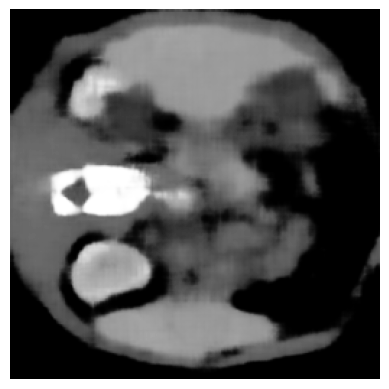

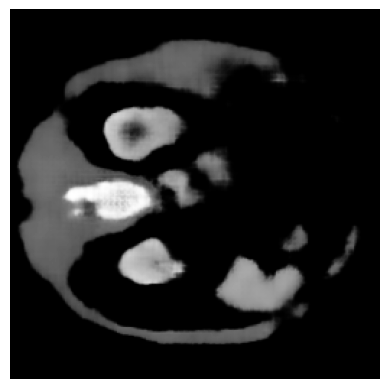

Epoch 767 -- loss: 0.4571
Epoch 768 -- loss: 0.4556
Epoch 769 -- loss: 0.4549
Epoch 770 -- loss: 0.4563
Epoch 771 -- loss: 0.4560
Epoch 772 -- loss: 0.4557
Epoch 773 -- loss: 0.4558
Epoch 774 -- loss: 0.4553
Epoch 775 -- loss: 0.4550
Epoch 776 -- loss: 0.4550
Epoch 777 -- loss: 0.4562
Epoch 778 -- loss: 0.4557
Epoch 779 -- loss: 0.4562
Epoch 780 -- loss: 0.4545
Epoch 781 -- loss: 0.4555


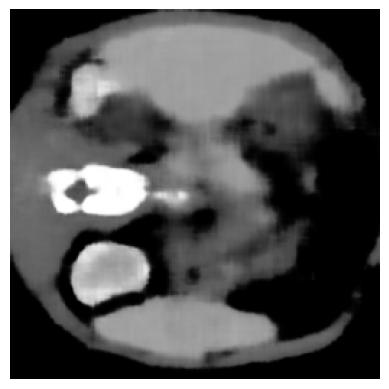

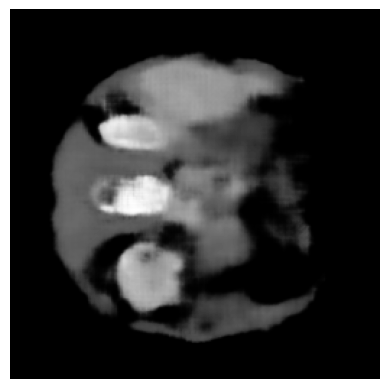

Epoch 782 -- loss: 0.4555
Epoch 783 -- loss: 0.4547
Epoch 784 -- loss: 0.4554
Epoch 785 -- loss: 0.4558
Epoch 786 -- loss: 0.4555
Epoch 787 -- loss: 0.4546
Epoch 788 -- loss: 0.4552
Epoch 789 -- loss: 0.4552
Epoch 790 -- loss: 0.4553
Epoch 791 -- loss: 0.4550
Epoch 792 -- loss: 0.4549
Epoch 793 -- loss: 0.4544
Epoch 794 -- loss: 0.4542
Epoch 795 -- loss: 0.4546
Epoch 796 -- loss: 0.4547


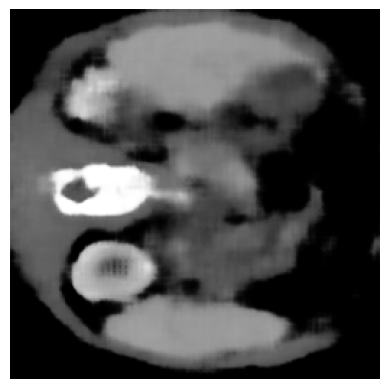

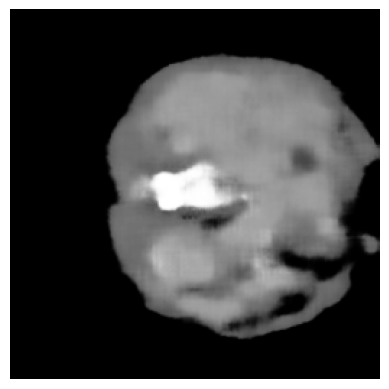

Epoch 797 -- loss: 0.4541
Epoch 798 -- loss: 0.4543
Epoch 799 -- loss: 0.4549
Epoch 800 -- loss: 0.4541
Epoch 801 -- loss: 0.4537
Epoch 802 -- loss: 0.4536
Epoch 803 -- loss: 0.4545
Epoch 804 -- loss: 0.4542
Epoch 805 -- loss: 0.4541
Epoch 806 -- loss: 0.4536
Epoch 807 -- loss: 0.4533
Epoch 808 -- loss: 0.4541
Epoch 809 -- loss: 0.4543
Epoch 810 -- loss: 0.4536
Epoch 811 -- loss: 0.4532


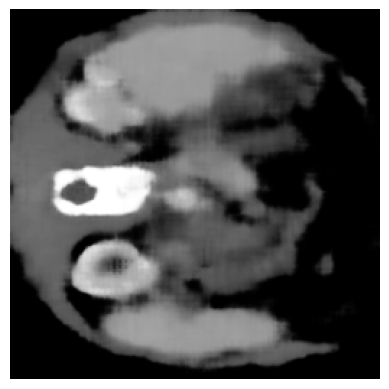

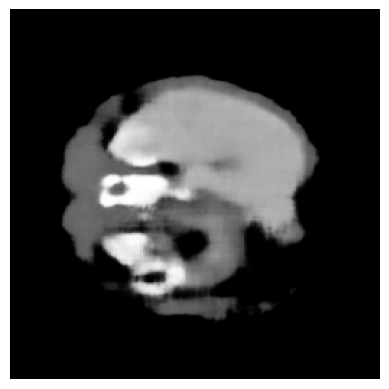

Epoch 812 -- loss: 0.4542
Epoch 813 -- loss: 0.4534
Epoch 814 -- loss: 0.4533
Epoch 815 -- loss: 0.4530
Epoch 816 -- loss: 0.4534
Epoch 817 -- loss: 0.4538
Epoch 818 -- loss: 0.4529
Epoch 819 -- loss: 0.4520
Epoch 820 -- loss: 0.4523
Epoch 821 -- loss: 0.4529
Epoch 822 -- loss: 0.4524
Epoch 823 -- loss: 0.4529
Epoch 824 -- loss: 0.4522
Epoch 825 -- loss: 0.4529
Epoch 826 -- loss: 0.4523


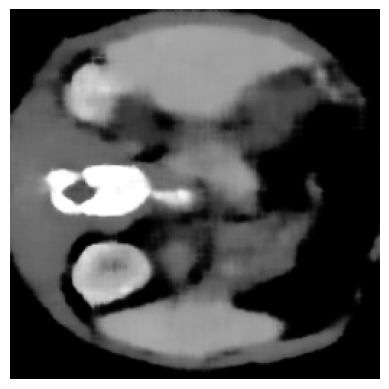

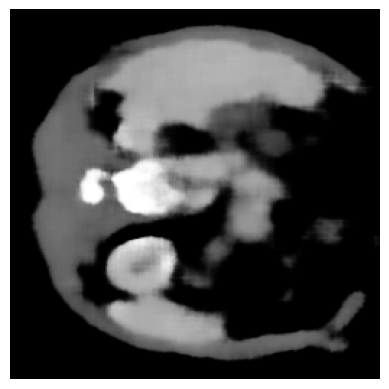

Epoch 827 -- loss: 0.4536
Epoch 828 -- loss: 0.4522
Epoch 829 -- loss: 0.4520
Epoch 830 -- loss: 0.4527
Epoch 831 -- loss: 0.4522
Epoch 832 -- loss: 0.4513
Epoch 833 -- loss: 0.4529
Epoch 834 -- loss: 0.4517
Epoch 835 -- loss: 0.4519
Epoch 836 -- loss: 0.4510
Epoch 837 -- loss: 0.4515
Epoch 838 -- loss: 0.4518
Epoch 839 -- loss: 0.4514
Epoch 840 -- loss: 0.4514
Epoch 841 -- loss: 0.4522


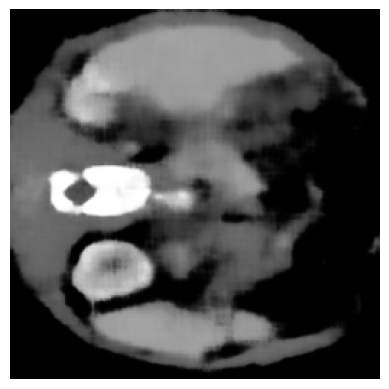

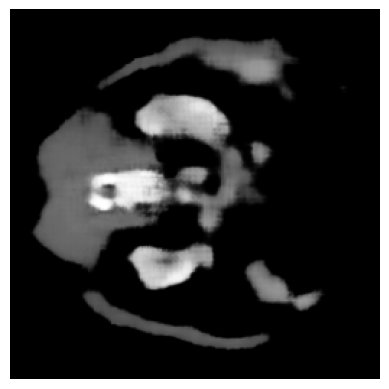

Epoch 842 -- loss: 0.4518
Epoch 843 -- loss: 0.4515
Epoch 844 -- loss: 0.4528
Epoch 845 -- loss: 0.4516
Epoch 846 -- loss: 0.4513
Epoch 847 -- loss: 0.4509
Epoch 848 -- loss: 0.4505
Epoch 849 -- loss: 0.4505
Epoch 850 -- loss: 0.4507
Epoch 851 -- loss: 0.4516
Epoch 852 -- loss: 0.4505
Epoch 853 -- loss: 0.4514
Epoch 854 -- loss: 0.4507
Epoch 855 -- loss: 0.4512
Epoch 856 -- loss: 0.4503


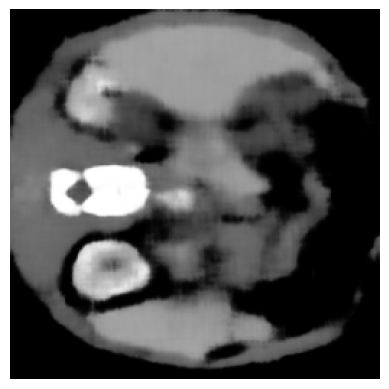

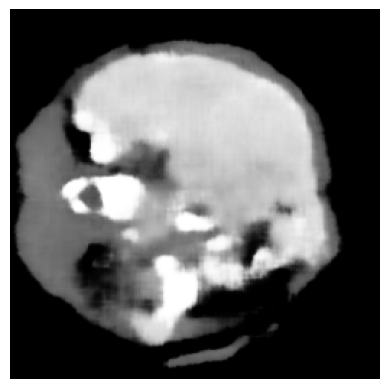

Epoch 857 -- loss: 0.4502
Epoch 858 -- loss: 0.4508
Epoch 859 -- loss: 0.4503
Epoch 860 -- loss: 0.4506
Epoch 861 -- loss: 0.4498
Epoch 862 -- loss: 0.4502
Epoch 863 -- loss: 0.4500
Epoch 864 -- loss: 0.4494
Epoch 865 -- loss: 0.4507
Epoch 866 -- loss: 0.4500
Epoch 867 -- loss: 0.4504
Epoch 868 -- loss: 0.4499
Epoch 869 -- loss: 0.4498
Epoch 870 -- loss: 0.4498
Epoch 871 -- loss: 0.4504


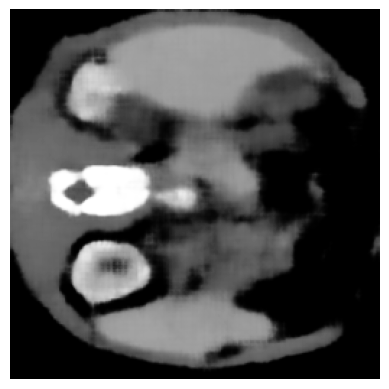

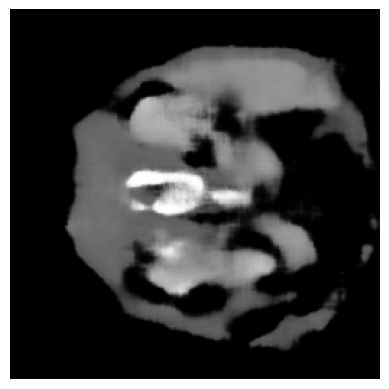

Epoch 872 -- loss: 0.4494
Epoch 873 -- loss: 0.4490
Epoch 874 -- loss: 0.4493
Epoch 875 -- loss: 0.4498
Epoch 876 -- loss: 0.4498
Epoch 877 -- loss: 0.4495
Epoch 878 -- loss: 0.4488
Epoch 879 -- loss: 0.4493
Epoch 880 -- loss: 0.4496
Epoch 881 -- loss: 0.4500
Epoch 882 -- loss: 0.4490
Epoch 883 -- loss: 0.4482
Epoch 884 -- loss: 0.4501
Epoch 885 -- loss: 0.4484
Epoch 886 -- loss: 0.4488


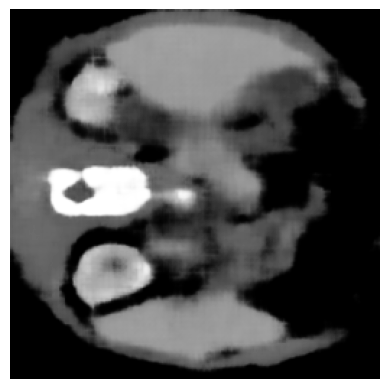

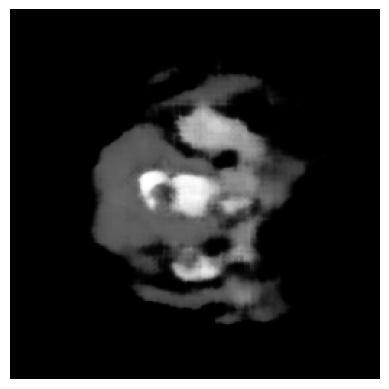

Epoch 887 -- loss: 0.4495
Epoch 888 -- loss: 0.4492
Epoch 889 -- loss: 0.4484
Epoch 890 -- loss: 0.4491
Epoch 891 -- loss: 0.4483
Epoch 892 -- loss: 0.4489
Epoch 893 -- loss: 0.4481
Epoch 894 -- loss: 0.4489
Epoch 895 -- loss: 0.4492
Epoch 896 -- loss: 0.4484
Epoch 897 -- loss: 0.4485
Epoch 898 -- loss: 0.4486
Epoch 899 -- loss: 0.4487
Epoch 900 -- loss: 0.4482
Epoch 901 -- loss: 0.4498


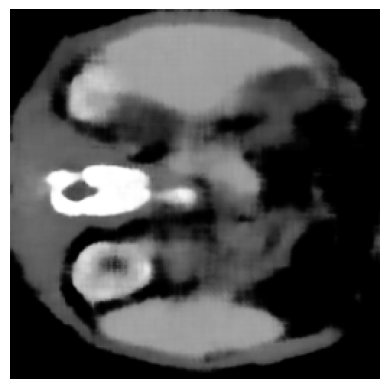

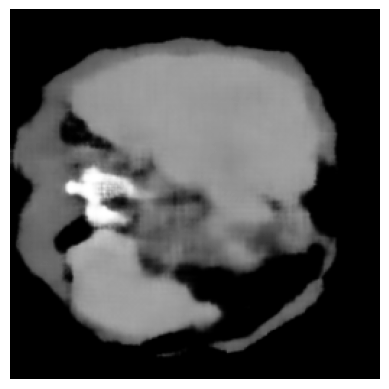

Epoch 902 -- loss: 0.4484
Epoch 903 -- loss: 0.4481
Epoch 904 -- loss: 0.4487
Epoch 905 -- loss: 0.4479
Epoch 906 -- loss: 0.4485
Epoch 907 -- loss: 0.4489
Epoch 908 -- loss: 0.4476
Epoch 909 -- loss: 0.4479
Epoch 910 -- loss: 0.4485
Epoch 911 -- loss: 0.4486
Epoch 912 -- loss: 0.4477
Epoch 913 -- loss: 0.4475
Epoch 914 -- loss: 0.4476
Epoch 915 -- loss: 0.4471
Epoch 916 -- loss: 0.4478


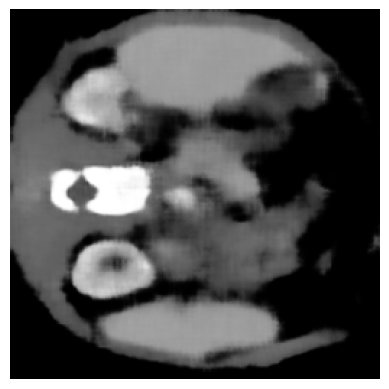

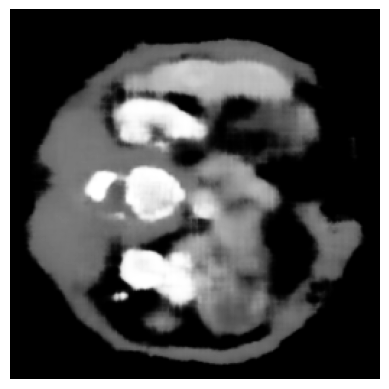

Epoch 917 -- loss: 0.4480
Epoch 918 -- loss: 0.4477
Epoch 919 -- loss: 0.4477
Epoch 920 -- loss: 0.4482
Epoch 921 -- loss: 0.4465
Epoch 922 -- loss: 0.4482
Epoch 923 -- loss: 0.4471
Epoch 924 -- loss: 0.4472
Epoch 925 -- loss: 0.4474
Epoch 926 -- loss: 0.4465
Epoch 927 -- loss: 0.4469
Epoch 928 -- loss: 0.4471
Epoch 929 -- loss: 0.4461
Epoch 930 -- loss: 0.4480
Epoch 931 -- loss: 0.4477


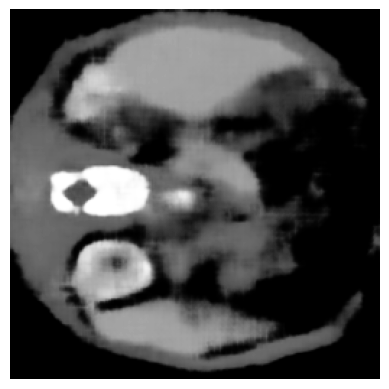

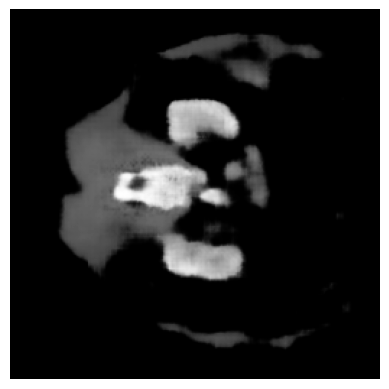

Epoch 932 -- loss: 0.4464
Epoch 933 -- loss: 0.4466
Epoch 934 -- loss: 0.4471
Epoch 935 -- loss: 0.4464
Epoch 936 -- loss: 0.4468
Epoch 937 -- loss: 0.5688
Epoch 938 -- loss: 0.4583
Epoch 939 -- loss: 0.4493
Epoch 940 -- loss: 0.4463
Epoch 941 -- loss: 0.4469
Epoch 942 -- loss: 0.4469
Epoch 943 -- loss: 0.4469
Epoch 944 -- loss: 0.4467
Epoch 945 -- loss: 0.4470
Epoch 946 -- loss: 0.4469


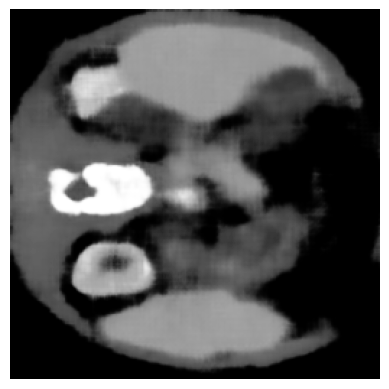

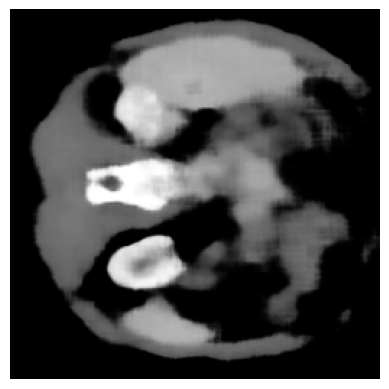

Epoch 947 -- loss: 0.4462
Epoch 948 -- loss: 0.4463
Epoch 949 -- loss: 0.4463
Epoch 950 -- loss: 0.4461
Epoch 951 -- loss: 0.4468
Epoch 952 -- loss: 0.4461
Epoch 953 -- loss: 0.4465
Epoch 954 -- loss: 0.4458
Epoch 955 -- loss: 0.4461
Epoch 956 -- loss: 0.4460
Epoch 957 -- loss: 0.4463
Epoch 958 -- loss: 0.4460
Epoch 959 -- loss: 0.4468
Epoch 960 -- loss: 0.4458
Epoch 961 -- loss: 0.4461


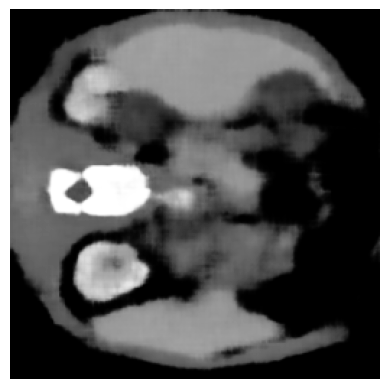

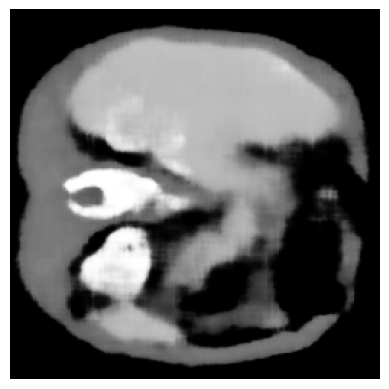

Epoch 962 -- loss: 0.4460
Epoch 963 -- loss: 0.4463
Epoch 964 -- loss: 0.4462
Epoch 965 -- loss: 0.4454
Epoch 966 -- loss: 0.4456
Epoch 967 -- loss: 0.4456
Epoch 968 -- loss: 0.4453
Epoch 969 -- loss: 0.4457
Epoch 970 -- loss: 0.4447
Epoch 971 -- loss: 0.4447
Epoch 972 -- loss: 0.4464
Epoch 973 -- loss: 0.4454
Epoch 974 -- loss: 0.4447
Epoch 975 -- loss: 0.4444
Epoch 976 -- loss: 0.4452


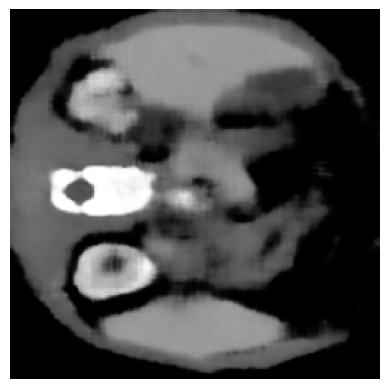

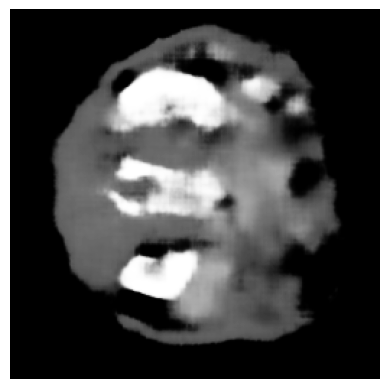

Epoch 977 -- loss: 0.4452
Epoch 978 -- loss: 0.4450
Epoch 979 -- loss: 0.4450
Epoch 980 -- loss: 0.4446
Epoch 981 -- loss: 0.4452
Epoch 982 -- loss: 0.4446
Epoch 983 -- loss: 0.4449
Epoch 984 -- loss: 0.4458
Epoch 985 -- loss: 0.4448
Epoch 986 -- loss: 0.4445
Epoch 987 -- loss: 0.4450
Epoch 988 -- loss: 0.4450
Epoch 989 -- loss: 0.4455
Epoch 990 -- loss: 0.4440
Epoch 991 -- loss: 0.4437


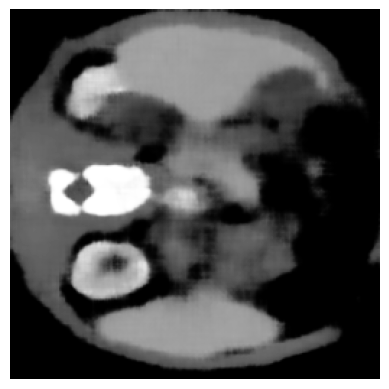

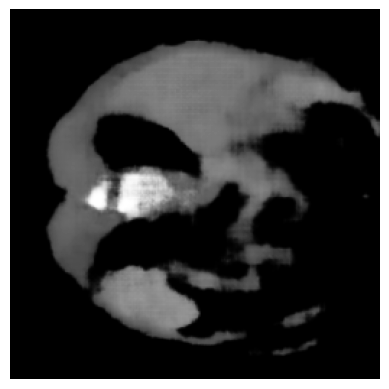

Epoch 992 -- loss: 0.4443
Epoch 993 -- loss: 0.4438
Epoch 994 -- loss: 0.4443
Epoch 995 -- loss: 0.4440
Epoch 996 -- loss: 0.4446
Epoch 997 -- loss: 0.4448
Epoch 998 -- loss: 0.4438
Epoch 999 -- loss: 0.4444
Epoch 1000 -- loss: 0.4446
Epoch 1001 -- loss: 0.4440
Epoch 1002 -- loss: 0.4439
Epoch 1003 -- loss: 0.4437
Epoch 1004 -- loss: 0.4445
Epoch 1005 -- loss: 0.4437
Epoch 1006 -- loss: 0.4442


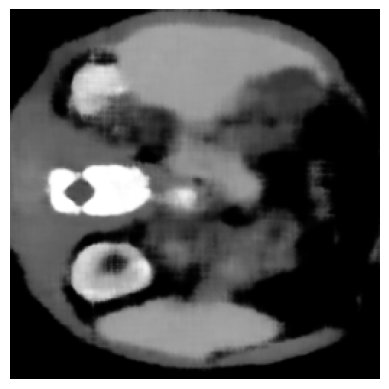

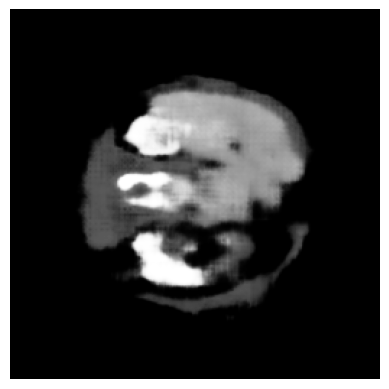

Epoch 1007 -- loss: 0.4427
Epoch 1008 -- loss: 0.4439
Epoch 1009 -- loss: 0.4438
Epoch 1010 -- loss: 0.4449
Epoch 1011 -- loss: 0.4436
Epoch 1012 -- loss: 0.4443
Epoch 1013 -- loss: 0.4432
Epoch 1014 -- loss: 0.4442
Epoch 1015 -- loss: 0.4438
Epoch 1016 -- loss: 0.4442
Epoch 1017 -- loss: 0.4430
Epoch 1018 -- loss: 0.4438
Epoch 1019 -- loss: 0.4432
Epoch 1020 -- loss: 0.4431
Epoch 1021 -- loss: 0.4434


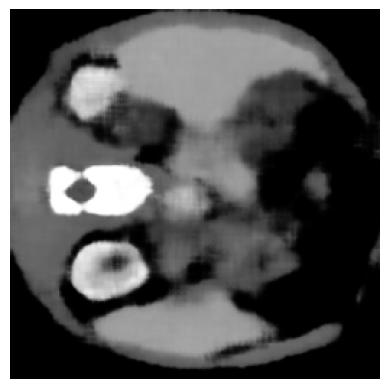

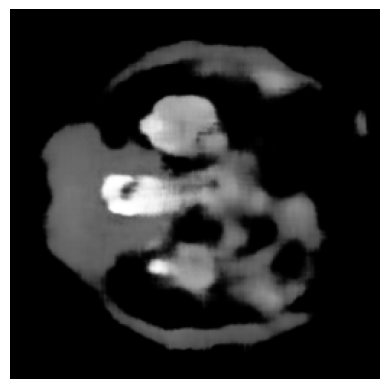

Epoch 1022 -- loss: 0.4430
Epoch 1023 -- loss: 0.4427
Epoch 1024 -- loss: 0.4438
Epoch 1025 -- loss: 0.4428
Epoch 1026 -- loss: 0.4432
Epoch 1027 -- loss: 0.4431
Epoch 1028 -- loss: 0.4424
Epoch 1029 -- loss: 0.4439
Epoch 1030 -- loss: 0.4432
Epoch 1031 -- loss: 0.4430
Epoch 1032 -- loss: 0.4438
Epoch 1033 -- loss: 0.4435
Epoch 1034 -- loss: 0.4430
Epoch 1035 -- loss: 0.4429
Epoch 1036 -- loss: 0.4430


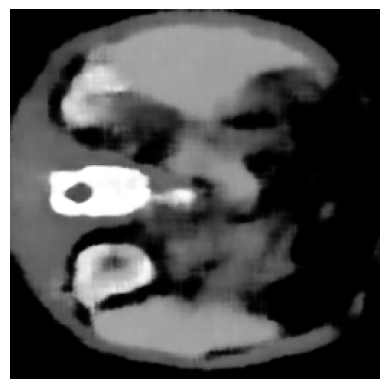

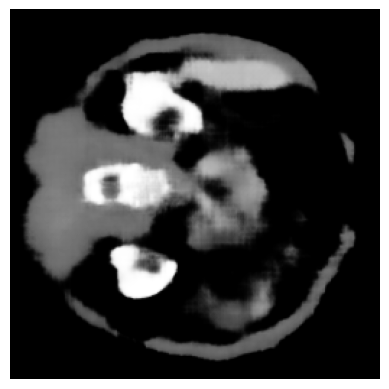

Epoch 1037 -- loss: 0.4430
Epoch 1038 -- loss: 0.4433
Epoch 1039 -- loss: 0.4436
Epoch 1040 -- loss: 0.4431
Epoch 1041 -- loss: 0.4419
Epoch 1042 -- loss: 0.4422
Epoch 1043 -- loss: 0.4434
Epoch 1044 -- loss: 0.4431
Epoch 1045 -- loss: 0.4426
Epoch 1046 -- loss: 0.4421
Epoch 1047 -- loss: 0.4416
Epoch 1048 -- loss: 0.4418
Epoch 1049 -- loss: 0.4423
Epoch 1050 -- loss: 0.4417
Epoch 1051 -- loss: 0.4426


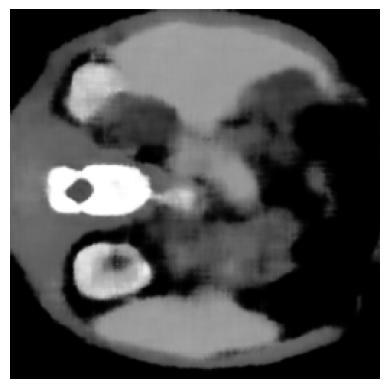

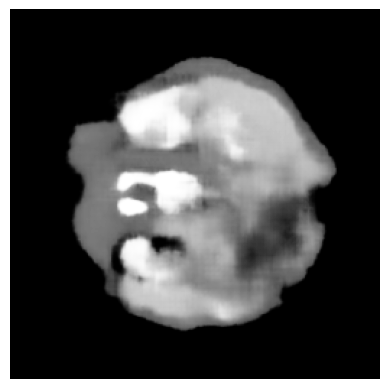

Epoch 1052 -- loss: 0.4418
Epoch 1053 -- loss: 0.4422
Epoch 1054 -- loss: 0.4424
Epoch 1055 -- loss: 0.4424
Epoch 1056 -- loss: 0.4421
Epoch 1057 -- loss: 0.4419
Epoch 1058 -- loss: 0.4433
Epoch 1059 -- loss: 0.4418
Epoch 1060 -- loss: 0.4424
Epoch 1061 -- loss: 0.4418
Epoch 1062 -- loss: 0.4418
Epoch 1063 -- loss: 0.4424
Epoch 1064 -- loss: 0.4417
Epoch 1065 -- loss: 0.4419
Epoch 1066 -- loss: 0.4427


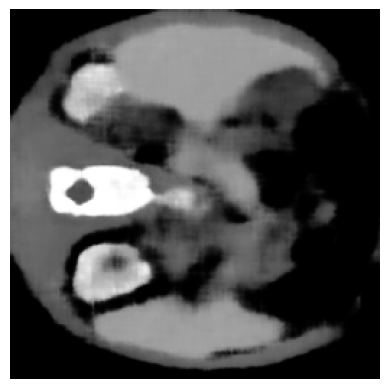

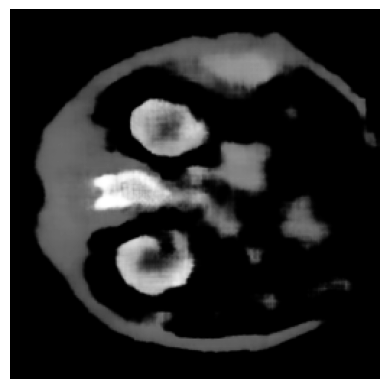

Epoch 1067 -- loss: 0.4421
Epoch 1068 -- loss: 0.4419
Epoch 1069 -- loss: 0.4416
Epoch 1070 -- loss: 0.4419
Epoch 1071 -- loss: 0.4415
Epoch 1072 -- loss: 0.4414
Epoch 1073 -- loss: 0.4412
Epoch 1074 -- loss: 0.4415
Epoch 1075 -- loss: 0.4414
Epoch 1076 -- loss: 0.4423
Epoch 1077 -- loss: 0.4416
Epoch 1078 -- loss: 0.4416
Epoch 1079 -- loss: 0.4418
Epoch 1080 -- loss: 0.4418
Epoch 1081 -- loss: 0.4415


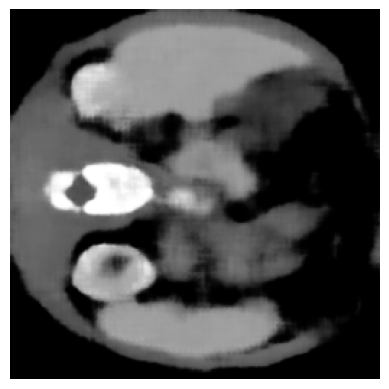

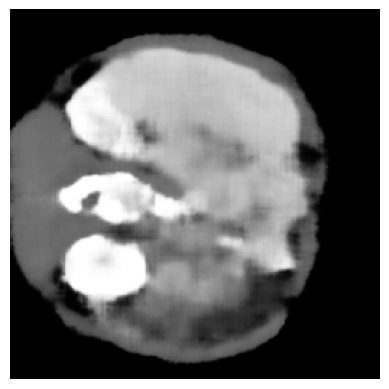

Epoch 1082 -- loss: 0.4409
Epoch 1083 -- loss: 0.4413
Epoch 1084 -- loss: 0.4415
Epoch 1085 -- loss: 0.4415
Epoch 1086 -- loss: 0.4412
Epoch 1087 -- loss: 0.4412
Epoch 1088 -- loss: 0.4409


In [ ]:
device = torch.device('cuda:0')

num_epochs = 5000
init_lr = 5e-4

# model
vae = VAE()
vae.cuda()

# optimizer
optimizer = optim.Adam(vae.parameters(), lr=init_lr)

# criterion
l1_loss = nn.L1Loss()    

def kld_loss(mu, logvar):
    return (-0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp()))

def criterion(img_batch, recon, mu, logvar):
    return l1_loss(recon, img_batch) + kld_loss(mu, logvar)


# statistics
train_losses = []
test_losses = []

# for num_epochs


for epoch in range(num_epochs):
  
    # train mode
    vae.train()
    
    # statistics
    running_loss = 0.0
    
    # for each mini-batch
    for img_batch in train_loader:

        # to GPU
        img_batch = img_batch.to(device)
        #print(img_batch.shape)
        
        
        # zero the parameter gradients
        optimizer.zero_grad()
        
        # forward + backward + optimize
        recon, mu, logvar = vae(img_batch)
        #print("recon", recon.shape)
        #print("Img_batch", img_batch.shape)
        loss = criterion(img_batch, recon, mu, logvar)
        loss.backward()
        optimizer.step()
        
        # statistics
        running_loss += loss.item()
    
    running_loss /= (len(train_loader) // 4)
    
    train_losses.append(running_loss)
    
    # output
    print('Epoch {} -- loss: {:.4f}'.format(epoch + 1, running_loss))
    
    # visualize reconstruction and synthesis
    if((epoch%15==0) or (epoch==num_epochs-1)):
        
        
        torch.save({
            'epoch': epoch,
            'model_state_dict': vae.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'loss': running_loss,
            }, r'D:\LumenResearchDataBase\DataBase\combine\group4\Combinned4Model\vae_group4.pt')
        
        
        img_batch = img_batch[:4]  # Ensure img_batch is on the same device (CPU) as recon
        recon = recon[:4]  # Move recon to CPU

        img_to_display = recon[0, 2].cpu().detach().numpy()  # First image, first channel
        #print(img_to_display.dtype)
        #print(img_to_display.min())
        #print(img_to_display.max())
        
        
        
        plt.imshow(img_to_display, cmap='gray')
        plt.axis('off')
        plt.show()
        
        sample = torch.randn(1, 512, 1, 1).cuda()
        recon = vae.decode(sample)
        plt.imshow(recon[0, 2].detach().cpu().numpy(), cmap='gray')
        plt.axis('off')
        plt.show()


In [15]:
state_dict = vae.state_dict()

# Save the state dictionary
torch.save(state_dict, 'vae_model_state_dict.pth')

In [17]:
torch.save(vae, 'vae_model_complete.pth')